### T-Period Consumption-Saving Model with Labor Supply and Transitory Shocks

This code solves and simulates a finite-horizon $(T)$-period consumption-saving model with endogenous labor supply **and** i.i.d. transitory wage shocks. At each period $t = 1, \dots, T$, the agent chooses consumption $c_t$ and labor supply $\ell_t \in [0,1]$ to maximize lifetime utility. In contrast to the no-uncertainty case, wages now depend on a transitory shock $\varepsilon_t$, which modifies the budget constraint. The agent’s problem is:

$$
V_t(a_t) \;=\; \max_{c_t > 0, \,\ell_t \in [0,1]}
\Bigl\{
  \frac{c_t^{\,1-\rho}}{1-\rho}
  \;-\;
  \varphi \,\cdot \frac{h_t^{\,1+\eta}}{1+\eta}
  \;+\;
  \beta \,\mathbb{E}\bigl[V_{t+1}(a_{t+1})\bigr]
\Bigr\},
$$

$$
\text{s.t.}\quad a_{t+1}
\;=\;
(1+r)\,a_t
\;+\;
w_t(\varepsilon_t)\,\cdot h_t
\;-\;
c_t,
$$

$$
a_t \;\ge\; 0
\quad (\text{No borrowing constraint}).
$$

---

### Model Parameter Settings

| **Parameter**       | **Value**               | **Description**                                                  |
|---------------------|-------------------------|------------------------------------------------------------------|
| `T`                 | 50                      | Number of periods                                                |
| `β (beta)`          | 0.97                    | Discount factor                                                  |
| `ρ (rho)`           | 1.0                     | Relative risk aversion (CRRA)                                    |
| `φ (phi)`           | 20.0                    | Weight on utility of leisure                                     |
| `η (eta)`           | 2.0                     | Curvature parameter for leisure utility                          |
| `α (alpha)`         | 0.08                    | Productivity factor (augmenting the wage with accumulated labor) |
| `w`                 | 12.5                 | Base wage rate (before shocks)                                   |
| `τ (tau)`           | 0.25                    | Labor income tax rate                                            |
| `r`                 | 0.03                    | Interest rate                                                    |
| `a_max`             | 150,000               | Maximum assets in the grid                                       |
| `a_min`             | 0                       | Minimum assets (no borrowing)                                    |
| `Na`                | 30                      | Number of asset grid points                                      |
| `k_max`             | 30.0                    | Maximum "capital" for labor efficiency                           |
| `Nk`                | 30                      | Number of labor grid points                                      |
| `Nt`                | 3                       | Number of shock grid points (for quadrature)                     |
| `sigma_eps`  | 0.3                     | Std. dev. of transitory lognormal wage shocks                    |
| `t_grid`            | Gauss-Hermite nodes      | Possible transitory shock values (lognormal)                     |
| `t_weight`          | Normalized G-H weights   | Probability weights for each shock node                          |
| `y`                  | 5000.0                  | Unearned Income                                                    |

In each period, the agent’s *effective wage* is given by

$$
w_t(\varepsilon_t)
\;=\;
(1 - \tau)\,w\,\varepsilon_t
\;\Bigl[\,1 + \alpha\,(\text{Human Capital})\Bigr],
$$

reflecting both taxation $\tau$, transitory shocks $\varepsilon_t$, and productivity growth via past labor $(\alpha)$. The solution routine uses value function iteration over a 4-dimensional state space $(a,k,\varepsilon,t)$, and the simulation draws random shocks each period to track how consumption and labor adjust over time.

---

### Script Overview

1. **Nonlinear Grids**  
   - `nonlinspace` creates a curved grid for assets or labor.
   - `create_focused_grid` refines the asset grid near a focal point (e.g., mid-range assets).

2. **Model Definition**  
   - `ConSavLabor_stochastic` stores parameters, grids, arrays for the solution (`sol_c, sol_h, sol_v`), and simulation (`sim_a, sim_c, sim_h, …`), as well as the shock structure (`t_grid`, `t_weight`).

3. **Solver**  
   - `solve_model!` implements backward recursion, computing optimal consumption `c` and labor `h` for each state $(a,k,\varepsilon)$.  
   - The final period is a simpler one-step optimization, while earlier periods use nested optimization to account for future value.

4. **Simulation**  
   - `simulate_model!` uses the solved policy rules to simulate paths for assets, labor, and consumption for `simN` agents over `simT` periods.  
   - Each period, a transitory shock $\varepsilon_t$ is drawn from the shock grid, updating wages and decisions accordingly.

By introducing transitory wage shocks, this framework captures short-term fluctuations in income and labor supply while still modeling the long-run savings and labor trade-offs over a finite horizon.

### Setup

In [2]:
using Random, NLopt, LinearAlgebra, Interpolations, Base.Threads, DataFrames, Statistics
using Plots, Statistics, ProgressMeter, ForwardDiff, Distributions, Profile
using DataFrames, Measures, StatsBase, LaTeXStrings, Printf, FastGaussQuadrature

### Model

In [3]:

# -------------------------------
# Utility: Nonlinear Grid Creator
# -------------------------------
function nonlinspace(start::Float64, stop::Float64, num::Int, curv::Float64)
    lin_vals = range(0, stop=1, length=num)
    curved_vals = lin_vals .^ curv
    return start .+ (stop - start) .* curved_vals
end

function create_focused_grid(a_min::Float64, a_focus::Float64, a_max::Float64, Na::Int, focus_share::Float64, curv::Float64)
    Na_focus = ceil(Int, Na * focus_share)
    Na_rest = Na - Na_focus
    grid_focus = nonlinspace(a_min, a_focus, Na_focus, curv)
    grid_rest = nonlinspace(a_focus, a_max, Na_rest + 1, curv)[2:end]
    return vcat(grid_focus, grid_rest)
end

# -------------------------------
# Dynamic Labor Model Definition
# -------------------------------
mutable struct ConSavLabor_stochastic
    T::Int                       # Time periods
    rho::Float64                 # Risk aversion (CRRA)
    beta::Float64                # Discount factor
    phi::Float64                 # Weight on labor disutility
    eta::Float64                 # Frisch elasticity parameter
    alpha::Float64               # Productivity or returns to labor
    w::Float64                   # Base wage rate
    y::Float64                   # Non-labor income
    tau::Float64                 # Labor income tax
    r::Float64                   # Interest rate
    a_max::Float64               # Max asset level
    a_min::Float64               # Min asset level
    Na::Int                      # Number of asset grid points
    k_max::Float64               # Max labor effort
    Nk::Int                      # Number of labor grid points
    simT::Int                    # Simulation time periods
    simN::Int                    # Number of simulated agents
    a_grid::Vector{Float64}      # Asset grid
    k_grid::Vector{Float64}      # Labor grid

    Nt::Int                      # Number of grid points for t
    t_grid::Vector{Float64}      # Grid for transitory shock t
    sigma_eps::Float64           # Std dev of transitory shock
    t_weight::Vector{Float64}    # Weights for t quadrature

    sol_c::Array{Float64,4}      # Optimal consumption [T, Na, Nk, Nt]
    sol_h::Array{Float64,4}      # Optimal labor effort [T, Na, Nk, Nt]
    sol_v::Array{Float64,4}      # Value function [T, Na, Nk, Nt]
    
    sim_c::Array{Float64,2}      # Simulated consumption [simN, simT]
    sim_h::Array{Float64,2}      # Simulated labor [simN, simT]
    sim_a::Array{Float64,2}      # Simulated assets [simN, simT]
    sim_k::Array{Float64,2}      # Simulated labor choice [simN, simT]
    sim_t::Array{Float64,2}      # Simulated transitory shock [simN, simT]
    sim_a_init::Vector{Float64}  # Initial assets
    sim_k_init::Vector{Float64}  # Initial labor effort
    sim_w_eff::Array{Float64,2}  # Effective wage for simulation [simN, simT]
    sim_income::Array{Float64,2}  # Simulated income [simN, simT]

    
    draws_uniform::Array{Float64,2}  # Uniform draws for simulation [simN, simT]
    w_vec::Vector{Float64}       # Time-varying wage vector [T]
end

# -------------------------------
# Constructor for ConSavLabor
# -------------------------------
function ConSavLabor_stochastic(; T::Int=50, beta::Float64=0.97, rho::Float64=1.0,
                     y::Float64=0.5, r::Float64=0.03, a_max::Float64=20.0,
                     Na::Int=30, simN::Int=5000, a_min::Float64=0.0, k_max::Float64=30.0,
                     Nk::Int=30, w::Float64=12.5, tau::Float64=0.25,
                     eta::Float64=2.0, alpha::Float64=0.08,
                     phi::Float64=20.0, seed::Int=1234,
                     sigma_eps::Float64=0.3, Nt::Int=3)
    simT = T
    a_grid = create_focused_grid(a_min, 7.0, a_max, Na, 0.7, 1.2)
    k_grid = nonlinspace(0.0, k_max, Nk, 1.5)

    # Gauss-Hermite quadrature for shocks
    # Gauss-Hermite quadrature for epsilon ~ N(0,1)
    nodes, weights = gausshermite(Nt)
    # Define shock grid for log-normal distribution
    mu = -0.5 * sigma_eps^2  # Ensures E[t_shock] = 1
    t_grid = exp.(mu .+ sigma_eps .* nodes)  # t_shock = exp(epsilon), epsilon ~ N(mu, sigma_eps^2)
    t_weight = weights / sum(weights)  # Normalize weights to sum to 1

    # Solution storage
    sol_shape = (T, Na, Nk, Nt)  
    sol_c = fill(NaN, sol_shape)   # Now 4D to include shocks
    sol_h = fill(NaN, sol_shape)
    sol_v = fill(NaN, sol_shape)  # Value function is expected value, so still 3D

    # Simulation storage
    sim_shape = (simN, simT)
    sim_c = fill(NaN, sim_shape)
    sim_h = fill(NaN, sim_shape)
    sim_a = fill(NaN, sim_shape)
    sim_k = fill(NaN, sim_shape)
    sim_t = fill(NaN, sim_shape)
    sim_w_eff = fill(NaN, sim_shape)  # Effective wage for simulation
    sim_income = fill(NaN, sim_shape)  # Simulated income

    # Random draws
    rng = MersenneTwister(seed)
    draws_uniform = rand(rng, sim_shape...)

    # Initial conditions
    sim_a_init = zeros(Float64, simN)
    sim_k_init = zeros(Float64, simN)


    # Wage vector
    w_vec = fill(w, T)

    return ConSavLabor_stochastic(T, rho, beta, phi, eta, alpha, w, y, tau, r,
                       a_max, a_min, Na, k_max, Nk, simT, simN,
                       a_grid, k_grid,
                       Nt, t_grid, sigma_eps, t_weight,
                       sol_c, sol_h, sol_v,
                       sim_c, sim_h, sim_a, sim_k, sim_t,
                       sim_a_init, sim_k_init, sim_w_eff, sim_income,
                       draws_uniform, w_vec)
end


ConSavLabor_stochastic

In [4]:

# ------------------------------------------------
# Model Solver (Stochastic)
# ------------------------------------------------

function solve_model!(model::ConSavLabor_stochastic)
    T, Na, Nk, Nt = model.T, model.Na, model.Nk, model.Nt
    a_grid, k_grid, t_grid = model.a_grid, model.k_grid, model.t_grid
    sol_c, sol_h, sol_v = model.sol_c, model.sol_h, model.sol_v

    # --- Final period (t = T) ---
    for i_a in 1:Na, i_k in 1:Nk, i_t in 1:Nt
        assets = a_grid[i_a]
        capital = k_grid[i_k]
        t_shock = t_grid[i_t]
        function obj_wrapper(h_vec::Vector, grad::Vector)
            f = obj_last_period_stoch(model, h_vec, assets, capital, T, t_shock, grad)
            if length(grad) > 0
                grad[:] = -grad[:]  # Negate for minimization
            end
            return -f  # Minimize negative utility
        end
        opt = Opt(:LD_SLSQP, 1)
        lower_bounds!(opt, [1e-3])
        upper_bounds!(opt, [1.0])
        ftol_rel!(opt, 1e-8)
        maxeval!(opt, 1000)  # Set a maximum value for h
        min_objective!(opt, obj_wrapper)
        init = [0.3]
        (minf, h_vec, ret) = optimize(opt, init)
        h_opt = h_vec[1]
        cons = assets + wage_func(model, capital, T, t_shock) * h_opt + model.y
        sol_h[T, i_a, i_k, i_t] = h_opt
        sol_c[T, i_a, i_k, i_t] = cons
        sol_v[T, i_a, i_k, i_t] = -minf
    end

    # --- Earlier periods (t = T-1 to 1) ---
    @showprogress 1 "Solving working model..." for t in (T-1):-1:1
        interp = create_interp(model, sol_v, t + 1)
        for i_a in 1:Na, i_k in 1:Nk, i_t in 1:Nt
            assets = a_grid[i_a]
            capital = k_grid[i_k]
            t_shock = t_grid[i_t]
            function obj_wrapper(x::Vector, grad::Vector)
                f = obj_work_period_stoch(model, x, assets, capital, t, t_shock, interp, grad)
                if length(grad) > 0
                    grad[:] = -grad[:]  # Negate for minimization
                end
                return -f  # Minimize negative value function
            end
            
            opt = Opt(:LD_SLSQP, 2)
            lower_bounds!(opt, [0.01, 1e-3])
            upper_bounds!(opt, [30, 1.0])
            ftol_rel!(opt, 1e-8)
            maxeval!(opt, 1000)
            inequality_constraint!(opt, (x, grad) -> asset_constraint_stoch(x, grad, model, assets, capital, t, t_shock), 0.0)
            min_objective!(opt, obj_wrapper)
            init = [max(sol_c[t + 1, i_a, i_k, i_t], 1e-6), sol_h[t + 1, i_a, i_k, i_t]]
            (minf, x_opt, ret) = optimize(opt, init)
            sol_c[t, i_a, i_k, i_t] = x_opt[1]
            sol_h[t, i_a, i_k, i_t] = x_opt[2]
            sol_v[t, i_a, i_k, i_t] = -minf
        end
    end
end


# ------------------------------------------------
# Objective and Constraint Functions (Stochastic)
# ------------------------------------------------

@inline function obj_last_period_stoch(
    model::ConSavLabor_stochastic,
    h_vec::Vector,
    assets::Float64,
    capital::Float64,
    t::Int,
    t_shock::Float64,
    grad::Vector
)
    h = h_vec[1]
    w_eff = wage_func(model, capital, t, t_shock)
    c = assets + w_eff * h + model.y

    u = util(model, c, h)
    du_dc = c^(-model.rho)
    du_dh = -model.phi * h^model.eta
    du_dh_total = w_eff * du_dc + du_dh

    if length(grad) > 0
        grad[1] = du_dh_total
    end
    return u
end

@inline function obj_work_period_stoch(
    model::ConSavLabor_stochastic,
    x::Vector,
    assets::Float64,
    capital::Float64,
    t::Int,
    t_shock::Float64,
    interp,
    grad::Vector
)
    c, h = x[1], x[2]
    w_eff = wage_func(model, capital, t, t_shock)
    a_next = (1.0 + model.r) * assets + w_eff * h - c + model.y
    k_next = capital + h

    # Expected value over shocks
    V_next = 0.0
    gradV_c = 0.0
    gradV_h = 0.0
    for j in 1:model.Nt
        interp_j = interp[j]
        t_weight = model.t_weight[j]
        Vj = interp_j(a_next, k_next)
        gradV = Interpolations.gradient(interp_j, a_next, k_next)
        dV_da = gradV[1]
        dV_dk = gradV[2]
        V_next += t_weight * Vj
        gradV_c += t_weight * (-dV_da)
        gradV_h += t_weight * (w_eff * dV_da + dV_dk)
    end

    util_now = util(model, c, h)
    dutil_dc = c^(-model.rho)
    dutil_dh = -model.phi * h^model.eta

    V = util_now + model.beta * V_next

    if length(grad) > 0
        grad[1] = dutil_dc + model.beta * gradV_c
        grad[2] = dutil_dh + model.beta * gradV_h
    end
    return V
end

@inline function asset_constraint_stoch(
    x::Vector,
    grad::Vector,
    model::ConSavLabor_stochastic,
    assets::Float64,
    capital::Float64,
    t::Int,
    t_shock::Float64
)
    c, h = x[1], x[2]
    w_eff = wage_func(model, capital, t, t_shock)
    a_next = (1.0 + model.r) * assets + w_eff * h - c + model.y
    g = model.a_min - a_next  # g <= 0 ensures a_next >= a_min
    if length(grad) > 0
        grad[1] = 1.0
        grad[2] = -w_eff
    end
    return g
end


# ------------------------------------------------
# Supporting Functions
# ------------------------------------------------

@inline function util(model::ConSavLabor_stochastic, c, h)
    if model.rho == 1.0
        cons_utility = log(c)
    else
        cons_utility = (c^(1.0 - model.rho)) / (1.0 - model.rho)
    end
    labor_disutility = model.phi * (h^(1.0 + model.eta)) / (1.0 + model.eta)
    return cons_utility - labor_disutility
end

@inline function wage_func(model::ConSavLabor_stochastic, capital::Float64, t::Int, t_shock::Float64)
    return (1 - model.tau) * model.w_vec[t] * t_shock * (1.0 + model.alpha * capital) * 0.584
end

function create_interp(model::ConSavLabor_stochastic, sol_v::Array{Float64,4}, t::Int)
    return [LinearInterpolation((model.a_grid, model.k_grid), sol_v[t, :, :, i_t], extrapolation_bc=Line()) for i_t in 1:model.Nt]
end


create_interp (generic function with 1 method)

In [5]:
# --------------------------
# Simulation
# --------------------------
function simulate_model!(model::ConSavLabor_stochastic)
    simN, simT = model.simN, model.simT
    sim_a, sim_k, sim_t, sim_w_eff = model.sim_a, model.sim_k, model.sim_t , model.sim_w_eff
    sim_c, sim_h, sim_income = model.sim_c, model.sim_h, model.sim_income
    draws_uniform = model.draws_uniform

    # Precompute interpolation objects for each period and shock
    interp_dict = Dict()
    for t in 1:simT, i_t in 1:model.Nt
        sol_c_slice = model.sol_c[t, :, :, i_t]  # 4D array: (T, Na, Nk, Nt)
        sol_h_slice = model.sol_h[t, :, :, i_t]
        interp_dict[(t, i_t, :c)] = LinearInterpolation((model.a_grid, model.k_grid), sol_c_slice, extrapolation_bc=Line())
        interp_dict[(t, i_t, :h)] = LinearInterpolation((model.a_grid, model.k_grid), sol_h_slice, extrapolation_bc=Line())
    end

    # Initialize simulation
    for i in 1:simN
        sim_a[i, 1] = model.sim_a_init[i]  # Initial assets
        sim_k[i, 1] = model.sim_k_init[i]  # Initial capital
        sim_t[i, 1] = 0.0                  # Initial shock (e.g., zero)
    end

    # Simulation loop
    for i in 1:simN
        for t in 1:simT
            # Draw shock index using uniform draws and cumulative weights
            cum_weights = cumsum(model.t_weight)
            u = draws_uniform[i, t]
            i_t = findfirst(u .<= cum_weights)  # Select shock index
            sim_t[i, t] = model.t_grid[i_t]     # Realized shock

            # Apply policy functions for the realized shock
            interp_c = interp_dict[(t, i_t, :c)]
            interp_h = interp_dict[(t, i_t, :h)]
            sim_c[i, t] = interp_c(sim_a[i, t], sim_k[i, t])
            sim_h[i, t] = interp_h(sim_a[i, t], sim_k[i, t])
            sim_h[i, t] = clamp(sim_h[i, t], 0.0, 1.0)  # Hours in [0, 1]
            sim_w_eff[i, t] = wage_func(model, model.sim_k[i, t], t, model.sim_t[i, t]) / 0.584
        
            sim_income[i, t] = sim_w_eff[i, t] * sim_h[i, t] * 0.584 # Income from labor 

            # Update next period’s states (if not the last period)
            if t < simT
                w_eff = wage_func(model, sim_k[i, t], t, sim_t[i, t]) / 0.584
                income = w_eff * 0.584 * sim_h[i, t]
                sim_a[i, t+1] = (1 + model.r) * sim_a[i, t] + income - sim_c[i, t] + model.y
                sim_k[i, t+1] = sim_k[i, t] + sim_h[i, t]
            end
        end
    end
end

simulate_model! (generic function with 1 method)

### Labor Supply Elasticity Analysis

The code computes labor supply elasticity with respect to wage changes in a `ConSavLabor_stochastic` model by comparing average labor supply (`h`) under a baseline wage and a perturbed wage (`w * (1 + Δw_frac)`), for `Δw_frac = [0.01, 0.05, 0.08]`. It tests scenarios with `alpha = [0, 0.08]` (productivity effect) and `y = [0, 8000]` (unearned income), presenting results in a table.

In [78]:
using Random, NamedTupleTools, DataFrames

# Define the compute_elasticity function (unchanged)
function compute_elasticity(model_params::NamedTuple, Δw_frac::Float64; seed::Int=1234)
    rng = MersenneTwister(seed)
    
    # Baseline model
    model_baseline = ConSavLabor_stochastic(; model_params...)
    solve_model!(model_baseline)
    simulate_model!(model_baseline)
    h_baseline = mean(model_baseline.sim_h)
    
    # Perturbed model (wage increased by Δw_frac)
    w_perturbed = model_params.w * (1 + Δw_frac)
    perturbed_params = merge(model_params, (w = w_perturbed,))
    model_perturbed = ConSavLabor_stochastic(; perturbed_params...)
    solve_model!(model_perturbed)
    simulate_model!(model_perturbed)
    h_perturbed = mean(model_perturbed.sim_h)
    
    # Compute elasticity
    elasticity = (h_perturbed - h_baseline) / h_baseline / Δw_frac
    return elasticity
end

# Define base model parameters (unchanged)
base_params = (alpha = 0.08, y = 8000.0, w = 12.5, T = 50, beta = 0.97, rho = 1.0, 
               r = 0.03, a_max = 150000.0, Na = 30, simN = 5000, a_min = 0.0, 
               k_max = 30.0, Nk = 30, tau = 0.25, eta = 2.0, phi = 20.0, sigma_eps=0.3, Nt=3)

# Define scenarios
alphas = [0.0, 0.08]
ys = [0.0, 8000.0]
Δw_frac_values = [0.01, 0.05, 0.08]

# Initialize a DataFrame with corrected column names
column_names = ["Δw_frac", "α=0, y=0", "α=0, y=8000", "α=0.08, y=0", "α=0.08, y=8000"]
results = DataFrame([Float64[] for _ in 1:length(column_names)], column_names)

# Compute elasticities for each Δw_frac and scenario
for Δw in Δw_frac_values
    row = [Δw]
    for alpha in alphas
        for y in ys
            # Update model parameters for the scenario
            scenario_params = merge(base_params, (alpha = alpha, y = y))
            elasticity = compute_elasticity(scenario_params, Δw)
            push!(row, elasticity)
        end
    end
    push!(results, row)
end

# Print the results table
results

Solving working model... 100%|███████████████████████████| Time: 0:00:02
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|█████████████████████

Row,Δw_frac,"α=0, y=0","α=0, y=8000","α=0.08, y=0","α=0.08, y=8000"
,Float64,Float64,Float64,Float64,Float64
1,0.01,-0.000618358,0.117183,0.0064247,0.0736815
2,0.05,0.000661555,0.110972,0.00115541,0.0705041
3,0.08,0.000625253,0.108196,0.000121424,0.0687305


### Model and Counterfactual Simulation in a T-Period 
This script solves and simulates a finite-horizon (T-period) consumption-saving model under different economic scenarios. It compares a baseline model with four counterfactual experiments, focusing on how each setting affects average consumption and asset accumulation over time.


In [32]:
# ============================
# Baseline and Counterfactuals
# ============================
rng = MersenneTwister(1234)
# -- Baseline Model (Default Parameters) --
model_baseline = ConSavLabor_stochastic()
model_baseline.sim_a_init .= rand(rng, model_baseline.simN) .* 10;
solve_model!(model_baseline)
simulate_model!(model_baseline)
x = mean(model_baseline.sim_h);
# ----------------------------------------
# Counterfactual 1: Tax Rate Variations
# ----------------------------------------

# Lower tax rate (τ = 10%)
model_low_tax = ConSavLabor_stochastic(tau = 0.15)
model_low_tax.sim_a_init .= rand(rng, model_low_tax.simN) .* 10;
solve_model!(model_low_tax)
simulate_model!(model_low_tax)

# Higher tax rate (τ = 30%)
model_high_tax = ConSavLabor_stochastic(tau = 0.4)
model_high_tax.sim_a_init .= rand(rng, model_high_tax.simN) .* 10;
solve_model!(model_high_tax)
simulate_model!(model_high_tax)

# ----------------------------------------
# Counterfactual 2: Wage Variations
# ----------------------------------------

# Higher wage level (w = 150,000)
model_high_wage = ConSavLabor_stochastic(w = 25.0)
solve_model!(model_high_wage)
simulate_model!(model_high_wage)

# ----------------------------------------
# Counterfactual 3: Time Preference (Discount Factor β)
# ----------------------------------------

# More impatient agent (β = 0.96)
model_low_beta = ConSavLabor_stochastic(beta = 0.95)
solve_model!(model_low_beta)
simulate_model!(model_low_beta)

# More patient agent (β = 0.98)
model_high_beta = ConSavLabor_stochastic(beta = 0.99)
solve_model!(model_high_beta)
simulate_model!(model_high_beta)

# ----------------------------------------
# Counterfactual 4: Frisch Elasticity (η)
# ----------------------------------------

# Higher Frisch elasticity (η = 3.0 → more responsive labor supply)
model_high_fe = ConSavLabor_stochastic(eta = 3.0)
solve_model!(model_high_fe)
simulate_model!(model_high_fe)

# Lower Frisch elasticity (η = 7.0 → less responsive labor supply)
model_low_fe = ConSavLabor_stochastic(eta = 7.0)
solve_model!(model_low_fe)
simulate_model!(model_low_fe)

# ----------------------------------------
# Counterfactual 5: Initial Assets from Lognormal Distribution
# ----------------------------------------

# Assign initial assets from a LogNormal distribution with ~90% falling between $5k and $20k
μ = 9.4
σ = 0.45

model_lognormal = ConSavLabor_stochastic()
model_lognormal.sim_a_init .= rand(LogNormal(μ, σ), model_lognormal.simN) ./10000
solve_model!(model_lognormal)
simulate_model!(model_lognormal)

model_uniform = ConSavLabor_stochastic()
model_uniform.sim_a_init .= rand(rng, model_uniform.simN) .* 10
solve_model!(model_uniform)
simulate_model!(model_uniform)


# ----------------------------------------
# Counterfactual 7: Interest Rate Variations (r)
# ----------------------------------------

# Lower interest rate (r = 2%)
model_low_r = ConSavLabor_stochastic(r = 0.02)
solve_model!(model_low_r)
simulate_model!(model_low_r)

# Higher interest rate (r = 5%)
model_high_r = ConSavLabor_stochastic(r = 0.05)
solve_model!(model_high_r)
simulate_model!(model_high_r)

Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01
Solving working model... 100%|███████████████████████████| Time: 0:00:01


### Model Structure and Policy Function Visualization

- **Asset Grid (Top-left):**  
  Displays the nonlinear asset grid, with denser points at low asset levels.

- **Terminal Value Function (Top-right):**  
Depicts the value function at \(T = 50\), representing lifetime utility as a function of assets.

- **Terminal Consumption Policy (Middle-left):**  
  Shows optimal consumption at the terminal period (\(T = 50\)), where agents consume all available resources.

- **Early Consumption Policy (Middle-right):**  
  Illustrates optimal consumption at an earlier period (\(T = 10\)), reflecting saving behavior.

- **Early Labor Policy (Bottom-left):**  
  Displays optimal labor supply at \(T = 10\).

- **Terminal Labor Policy (Bottom-right):**  
  Shows optimal labor supply at \(T = 50\).

This layout clarifies how the asset grid design and time dynamics shape optimal consumption and labor decisions.

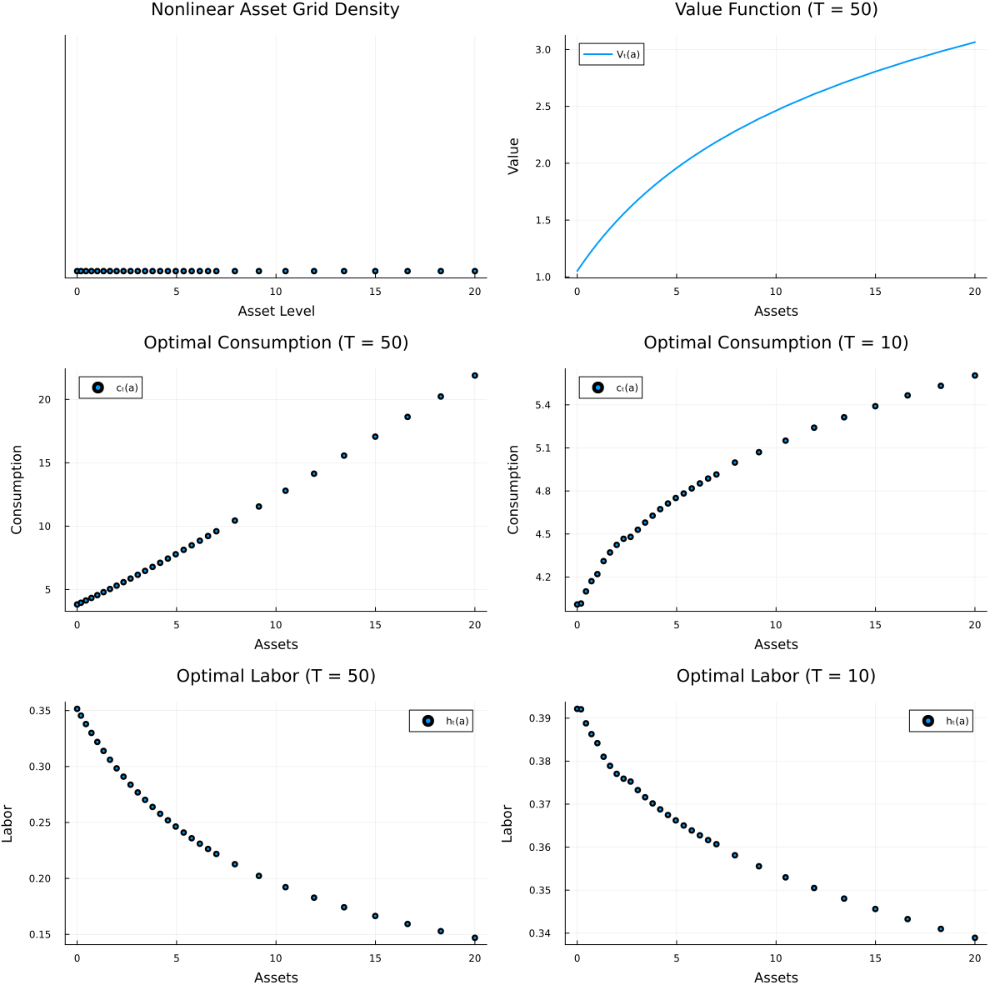

In [33]:

# Choose a representative labor grid index (e.g. the median)
k_mid = Int(ceil(length(model_baseline.k_grid)/2))
t_mid = Int(ceil(length(model_baseline.t_grid)/2))
T_terminal = model_baseline.T  # Terminal period (e.g., 50)
t_early = 10          # An earlier period for comparison

# 1. Plot the nonlinear asset grid
p1 = scatter(model_baseline.a_grid, zeros(length(model_baseline.a_grid)),
    xlabel = "Asset Level",
    yticks = [],
    title = "Nonlinear Asset Grid Density",
    markersize = 3,
    legend = false)

# 2. Plot optimal consumption policy at terminal period (T = model.T)
# Here we fix the labor dimension at k_mid.
p2 = scatter(model_baseline.a_grid, model_baseline.sol_c[T_terminal, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Consumption",
    title = "Optimal Consumption (T = $(T_terminal))",
    label = "cₜ(a)",
    markersize = 3)

# 3. Plot value function at terminal period (T = model.T)
# Note: use 'sol_v' (not sol_V) as per your definition.
p3 = plot(model_baseline.a_grid, model_baseline.sol_v[T_terminal, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Value",
    title = "Value Function (T = $(T_terminal))",
    label = "Vₜ(a)",
    linewidth = 2)

# 4. Plot optimal consumption policy at an earlier period (e.g., T = 10)
p4 = scatter(model_baseline.a_grid, model_baseline.sol_c[t_early, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Consumption",
    title = "Optimal Consumption (T = $(t_early))",
    label = "cₜ(a)",
    markersize = 3)

p5 = scatter(model_baseline.a_grid, model_baseline.sol_h[t_early, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Labor",
    title = "Optimal Labor (T = $(t_early))",
    label = "hₜ(a)",
    markersize = 3)

p6 = scatter(model_baseline.a_grid, model_baseline.sol_h[T_terminal, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Labor",
    title = "Optimal Labor (T = $(T_terminal))",
    label = "hₜ(a)",
    markersize = 3)

# Combine all plots into a 2×2 grid layout for comparison
plot(p1, p3, p2, p4, p6, p5, layout = (3, 2), size = (1200, 1200), margin=2mm)

### Labor Supply Response to Wage Changes Across Asset Quantiles

This code simulates a baseline and a counterfactual scenario using the `ConSavLabor_stochastic` model, with the counterfactual increasing the wage to `w=25.0`. It then visualizes the relationship between wages and hours worked (`h`) at specific time steps for agents grouped by asset quantiles (25th, 50th, 75th) from the baseline model. For each time step, it plots wage vs. hours worked for `N=100` agents closest to each quantile, using solid lines for the baseline and dashed lines for the counterfactual. We observe that under higher wages, individuals tend to work less across all asset groups.

Solving working model... 100%|███████████████████████████| Time: 0:00:05


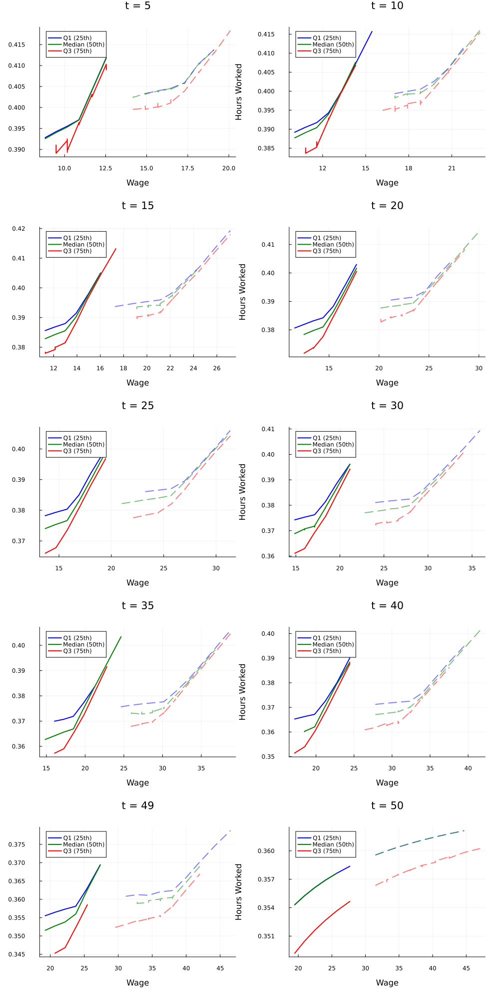

In [ ]:
# Simulate baseline and counterfactual models
model_baseline = ConSavLabor_stochastic(Nt = 10, sigma_eps=0.1)
#model_baseline.sim_a_init .= rand(rng, model_baseline.simN) .* 10;
solve_model!(model_baseline)
simulate_model!(model_baseline)

model_counterfactual = ConSavLabor_stochastic(Nt = 10, w = 20.0, sigma_eps=0.1)
solve_model!(model_counterfactual)
simulate_model!(model_counterfactual)

# Time steps and layout
time_steps = [5, 10, 15, 20, 25, 30, 35, 40, 49, 50]
custom_layout = @layout [grid(5, 2)]
plt = plot(layout=custom_layout, size=(1000, 2000), margin=5mm)
N = 100  # number of agents per quantile

for (i, t) in enumerate(time_steps)
    # Extract baseline values
    a_base = model_baseline.sim_a[:, t]
    w_base = model_baseline.sim_w_eff[:, t]
    h_base = model_baseline.sim_h[:, t]

    # Extract counterfactual values
    a_cf = model_counterfactual.sim_a[:, t]
    w_cf = model_counterfactual.sim_w_eff[:, t]
    h_cf = model_counterfactual.sim_h[:, t]

    # Quantiles from baseline
    Qs = quantile(a_base, [0.25, 0.50, 0.75])
    labels = ["Q1 (25th)", "Median (50th)", "Q3 (75th)"]
    colors = [:blue, :green, :red]

    for (q, label, color) in zip(Qs, labels, colors)
        # Indices of closest agents (baseline)
        ind_base = partialsortperm(abs.(a_base .- q), 1:N)
        x_base = w_base[ind_base]
        y_base = h_base[ind_base]
        idx_base = sortperm(x_base)
        plot!(plt[i], x_base[idx_base], y_base[idx_base], 
              color=color, label=label, lw=2)

        # Indices of closest agents (counterfactual)
        ind_cf = partialsortperm(abs.(a_cf .- q), 1:N)
        x_cf = w_cf[ind_cf]
        y_cf = h_cf[ind_cf]
        idx_cf = sortperm(x_cf)
        plot!(plt[i], x_cf[idx_cf], y_cf[idx_cf], 
              color=color, linestyle=:dash, alpha=0.5, lw=2, label="")
    end

    title!(plt[i], "t = $t")
    xlabel!(plt[i], "Wage")
    ylabel!(plt[i], "Hours Worked")
end

# Display plot
plt

### Variable Distribution Comparison Over Time 
This script defines a function that plots the distributions of a given variable (e.g., Assets, Hours, Wages, Consumption) at selected time periods. It creates uniform histograms with consistent x‑ and y‑axis limits and arranges them in a 2×2 grid using a colorful, enhanced visualization style for direct comparison.

In [42]:
function extract_distribution_arrays(model)
    return (
        assets_work      = model.sim_a,
        consumption_work = model.sim_c,
        hours_work       = model.sim_h,
        capital_work     = model.sim_k,
        income_work      = model.sim_income
    )
end

extract_distribution_arrays (generic function with 1 method)

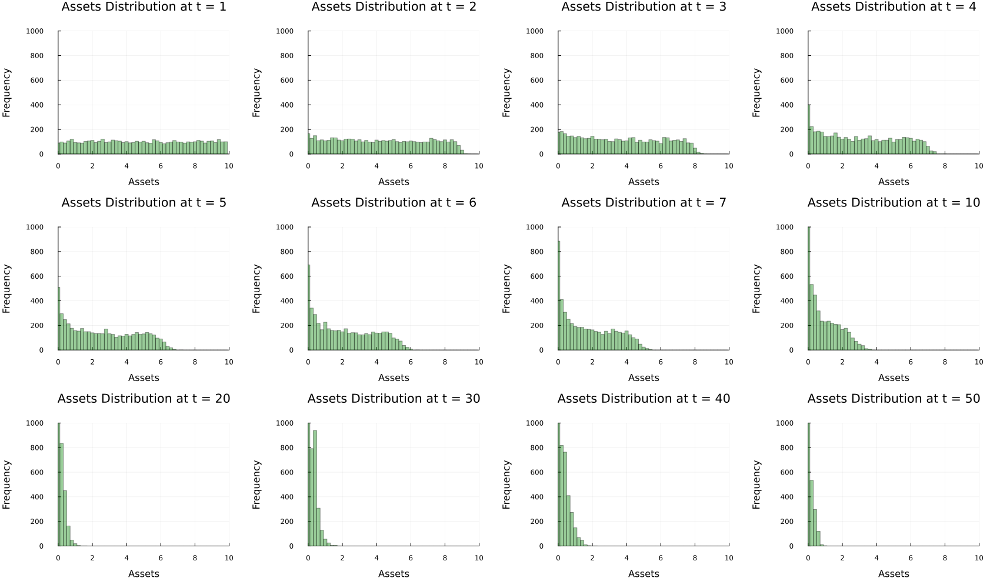

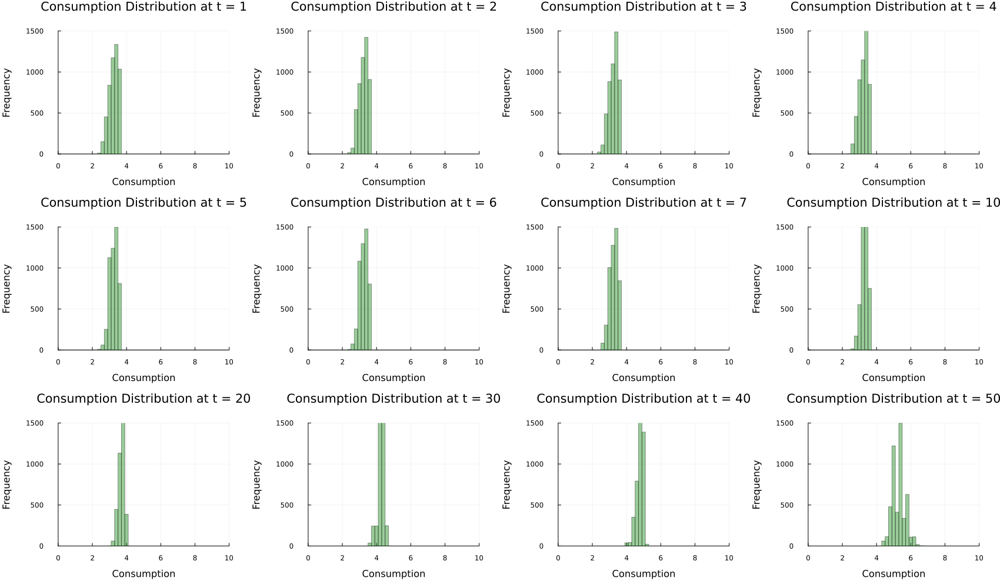

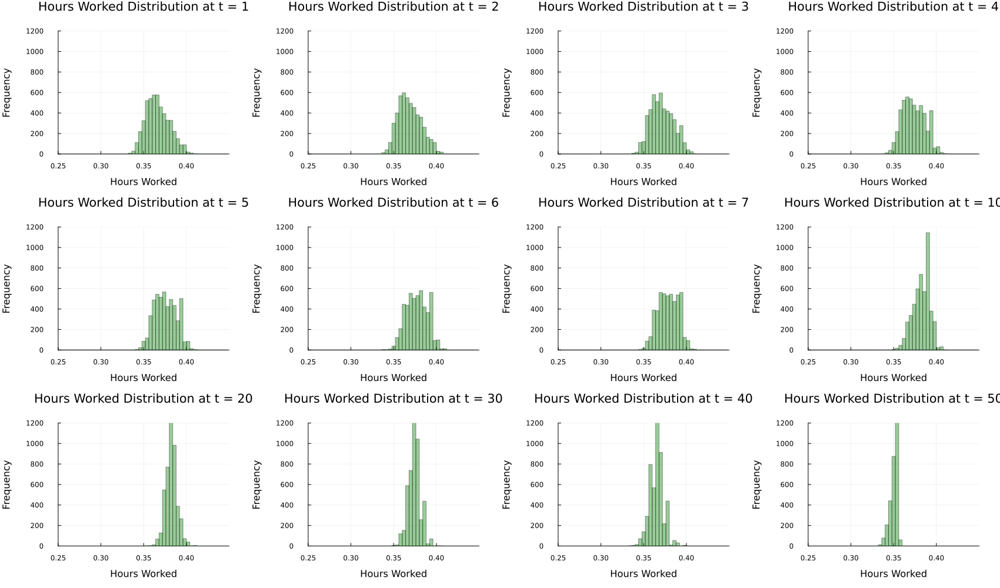

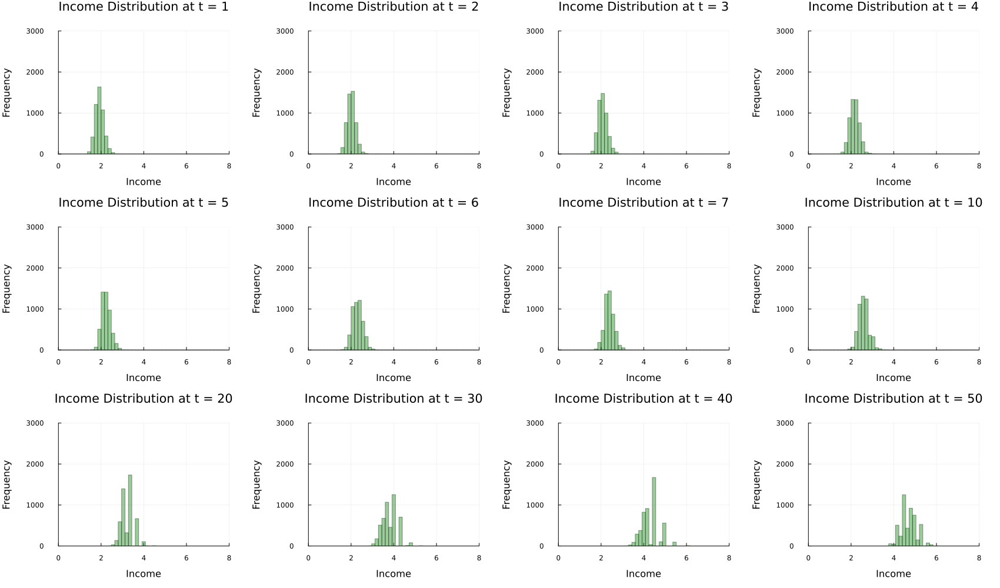

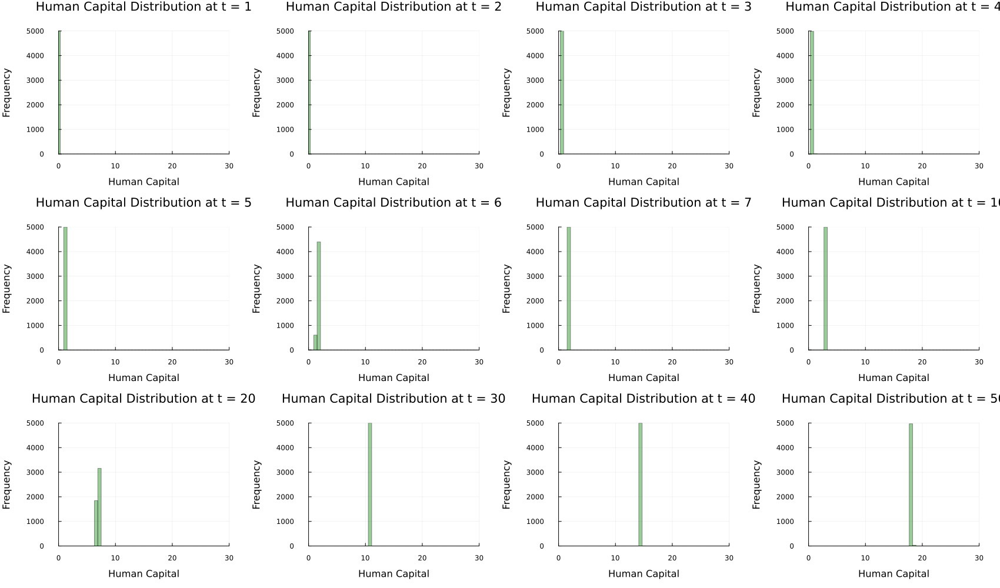

In [43]:
function plot_distribution_over_time(
    var_work; 
    var_name="Variable", 
    bin_max=10, 
    num_bins=50, 
    x_range=nothing,
    y_lim=(0, 1500)  # <-- new argument
)
    # Define bin edges
    if isnothing(x_range)
        x_min = 0
        x_max = bin_max
    else
        x_min, x_max = x_range
    end

    time_steps = [1, 2, 3, 4, 5, 6, 7, 10, 20, 30, 40, 50]
    bin_edges = range(x_min, stop=x_max, length=num_bins+1)
    bin_width = bin_edges[2] - bin_edges[1]
    n_agents = size(var_work, 1)

    plots = []

    for t in time_steps
        work_vals = var_work[:, t]
        hist_work = fit(Histogram, work_vals, bin_edges)

        p = bar(
            hist_work.edges[1][1:end-1],
            hist_work.weights;
            bar_width = bin_width,
            color = :green,
            alpha = 0.4,
            xlabel = var_name,
            ylabel = "Frequency",
            title  = "$var_name Distribution at t = $t",
            xlim = (x_min, x_max),
            ylim = y_lim,  # <-- use manual ylim
            legend = false
        )
        push!(plots, p)
    end

    combined = plot(
        plots...,
        layout = (3, 4),
        size = (1700, 1000),
        margin = 7mm
    )
    display(combined)
end

x = extract_distribution_arrays(model_baseline)

plot_distribution_over_time(x.assets_work; var_name="Assets", x_range=(0, 10), y_lim=(0, 1000))
plot_distribution_over_time(x.consumption_work; var_name="Consumption", x_range=(0, 10), y_lim=(0, 1500))
plot_distribution_over_time(x.hours_work; var_name="Hours Worked", x_range=(0.25, 0.45), y_lim=(0, 1200))
plot_distribution_over_time(x.income_work; var_name="Income", x_range=(0, 8), y_lim=(0, 3000))
plot_distribution_over_time(x.capital_work; var_name="Human Capital", x_range=(0, 30), y_lim=(0, 5000))

###  Counterfactual Analysis
We investigate the effects of key economic parameters on individual consumption, savings, labor effort, and human capital accumulation. Our **baseline model** is defined as follows:

In [34]:
t = 1:model_baseline.simT

function extract_all(model)
    return (
        c = mean(model.sim_c, dims=1)[:] .* 10,
        a = mean(model.sim_a, dims=1)[:] .* 10,
        h = mean(model.sim_h, dims=1)[:],
        k = mean(model.sim_k, dims=1)[:],
        income = mean(model.sim_income, dims=1)[:] .* 10,
        wage = mean(model.sim_w_eff, dims=1)[:]
    )
end



extract_all (generic function with 1 method)

##### Counterfactual 1: **Tax Rate Variations**

We vary the labor income tax rate to examine its impact on work incentives and savings behavior.

- **Baseline:** τ = 0.25
- **Low Tax:** τ = 0.15
- **High Tax:** τ = 0.40 

> 💡 **Interpretation:**  
> Lower taxes increase disposable income, which leads to higher consumption and more asset accumulation. Higher taxes reduce both, while increasing labor disincentives.


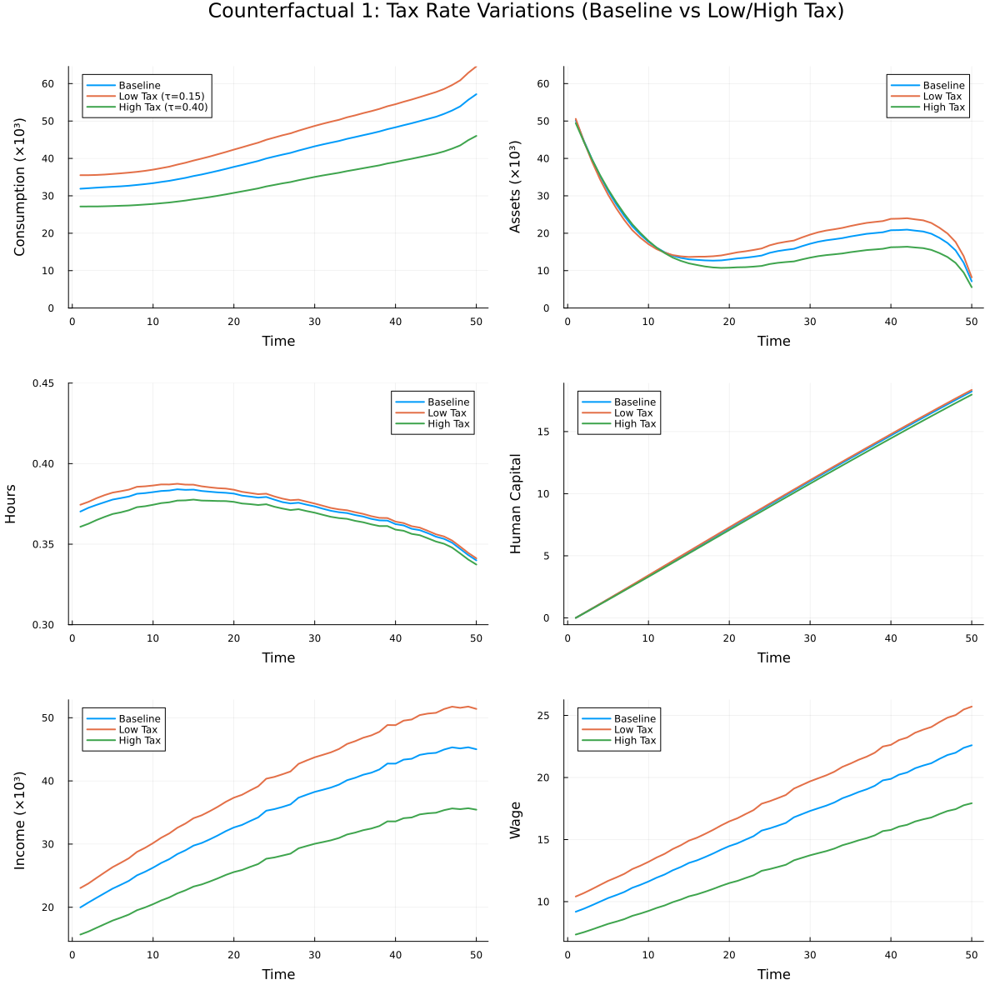

In [35]:
# ----------------------------------------------
# 1. Tax Rate Variations (Low and High Tax)
# ----------------------------------------------

thousand_formatter = (val -> @sprintf("%.0f", val/1_000))

# Extract data for each scenario
base = extract_all(model_baseline)
low_tax = extract_all(model_low_tax)
high_tax = extract_all(model_high_tax)

# Time vector (assuming t is defined, e.g., t = 1:model_baseline.T)
t = 1:length(base.c)  # Adjust based on your model's time horizon
ymax_c = maximum(vcat(base.c, low_tax.c, high_tax.c))
# Plot 1: Consumption
p1 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption (×10³)",
            ylims=(0, ymax_c))
plot!(p1, t, low_tax.c, label="Low Tax (τ=0.15)", lw=2)
plot!(p1, t, high_tax.c, label="High Tax (τ=0.40)", lw=2)


# Plot 2: Assets
ymax_a = maximum(vcat(base.a, low_tax.a, high_tax.a, ymax_c))
p2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets (×10³)",
            ylims=(0, ymax_a))
plot!(p2, t, low_tax.a, label="Low Tax", lw=2)
plot!(p2, t, high_tax.a, label="High Tax", lw=2)


# Plot 3: Hours
p3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours", ylims=(0.3, 0.45))
plot!(p3, t, low_tax.h, label="Low Tax", lw=2)
plot!(p3, t, high_tax.h, label="High Tax", lw=2)

# Plot 4: Human Capital
p4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(p4, t, low_tax.k, label="Low Tax", lw=2)
plot!(p4, t, high_tax.k, label="High Tax", lw=2)

# Plot 5: Income
p5 = plot(t, base.income, label="Baseline", lw=2, xlabel="Time", ylabel="Income (×10³)")
plot!(p5, t, low_tax.income, label="Low Tax", lw=2)
plot!(p5, t, high_tax.income, label="High Tax", lw=2)


# Plot 6: Wage
p6 = plot(t, base.wage, label="Baseline", lw=2, xlabel="Time", ylabel="Wage")
plot!(p6, t, low_tax.wage, label="Low Tax", lw=2)
plot!(p6, t, high_tax.wage, label="High Tax", lw=2)


# Combine into a 3x2 layout
combined_plot = plot(p1, p2, p3, p4, p5, p6,
                     layout=(3, 2),
                     size=(1200, 1200),
                     plot_title="Counterfactual 1: Tax Rate Variations (Baseline vs Low/High Tax)",
                     titlefont=16,
                     margin=3mm)

##### Counterfactual 2: **Wage Variations**

We increase the wage rate to study the response in labor effort, income, and savings.

- **Baseline:** w = 100,000  
- **High Wage:** w = 150,000  

> 💡 **Interpretation:**  
> A higher wage raises labor income and thus consumption and wealth, with little change in hours worked due to offsetting income and substitution effects.

Solving working model... 100%|███████████████████████████| Time: 0:00:01


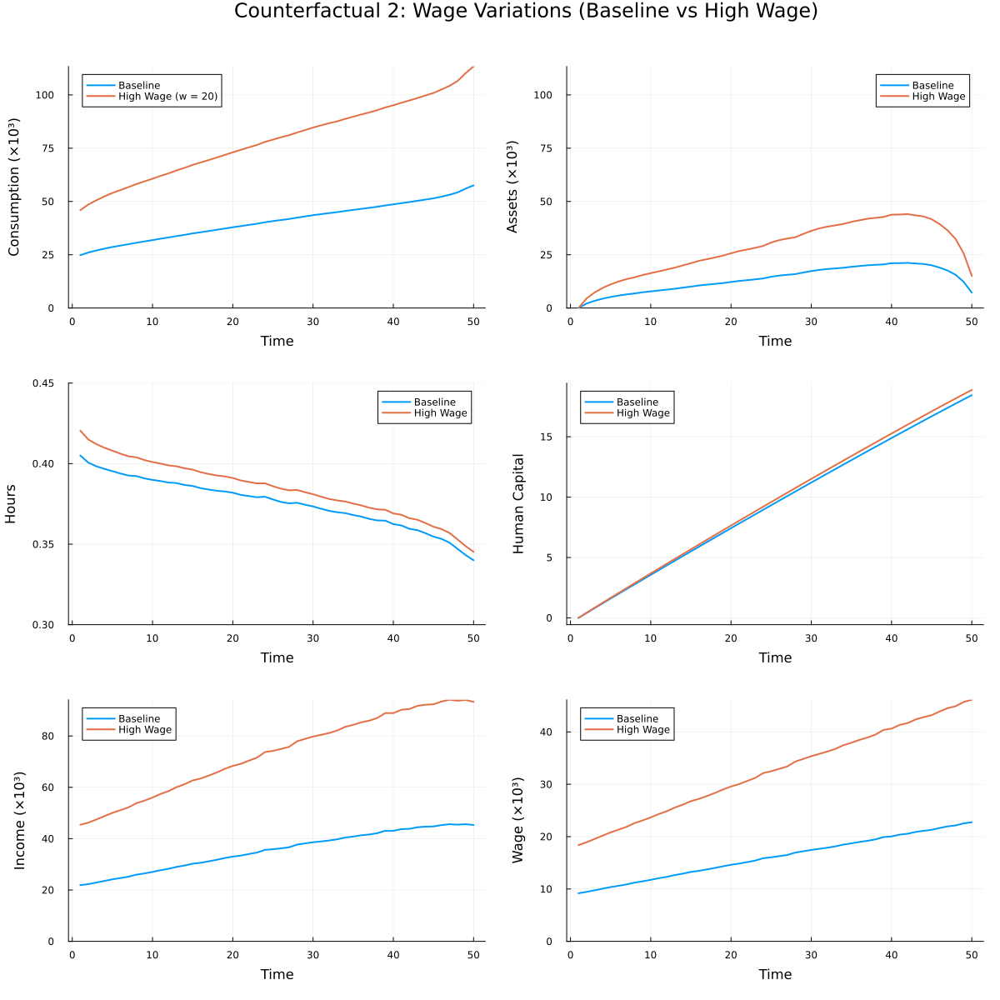

In [36]:
# ----------------------------------------------
# 2. Wage Variations (Baseline vs High Wage)
# ----------------------------------------------

model_baseline = ConSavLabor_stochastic(alpha = 0.08, y = 0.5)
solve_model!(model_baseline)
simulate_model!(model_baseline)

# Formatter for monetary values
thousand_formatter = (val -> @sprintf("%.0f", val / 1_000))

# Extract data
base = extract_all(model_baseline)
high_wage = extract_all(model_high_wage)

# Time vector
t = 1:length(base.c)

# Max values for consistent y-limits
ymax_c = maximum(vcat(base.c, high_wage.c))
ymax_a = maximum(vcat(base.a, high_wage.a, ymax_c))
ymax_income = maximum(vcat(base.income, high_wage.income))
ymax_wage = maximum(vcat(base.wage, high_wage.wage))

# Plot 1: Consumption
p1 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption (×10³)", ylims=(0, ymax_c))
plot!(p1, t, high_wage.c, label="High Wage (w = 20)", lw=2)


# Plot 2: Assets
p2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets (×10³)", ylims=(0, ymax_a))
plot!(p2, t, high_wage.a, label="High Wage", lw=2)


# Plot 3: Hours
p3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours", ylims=(0.3, 0.45))
plot!(p3, t, high_wage.h, label="High Wage", lw=2)

# Plot 4: Human Capital
p4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(p4, t, high_wage.k, label="High Wage", lw=2)

# Plot 5: Income
p5 = plot(t, base.income, label="Baseline", lw=2, xlabel="Time", ylabel="Income (×10³)", ylims=(0, ymax_income))
plot!(p5, t, high_wage.income, label="High Wage", lw=2)

# Plot 6: Wage
p6 = plot(t, base.wage, label="Baseline", lw=2, xlabel="Time", ylabel="Wage (×10³)", ylims=(0, ymax_wage))
plot!(p6, t, high_wage.wage, label="High Wage", lw=2)


# Combine into a 3x2 layout
combined_plot_2 = plot(p1, p2, p3, p4, p5, p6,
                       layout=(3, 2),
                       size=(1200, 1200),
                       plot_title="Counterfactual 2: Wage Variations (Baseline vs High Wage)",
                       titlefont=16,
                       margin=3mm)

##### Counterfactual 3: **Discount Factor Variations (Time Preference)**

We vary the discount factor $ \beta $ to analyze how patience affects consumption, savings, and labor supply behavior over the life cycle.

- **Baseline:** $ \beta = 0.97 $  
- **Low Beta:** $ \beta = 0.96 $ (more impatient)  
- **High Beta:** $ \beta = 0.98 $ (more patient)

> 💡 **Interpretation:**  
> A **lower $\beta$** leads to more present-oriented behavior—individuals **consume more early on**, **save less**, and **work more** to fund current consumption.  
> A **higher $\beta$** implies stronger future orientation—people **defer consumption**, **save more**, and **may work less** due to greater accumulated wealth.



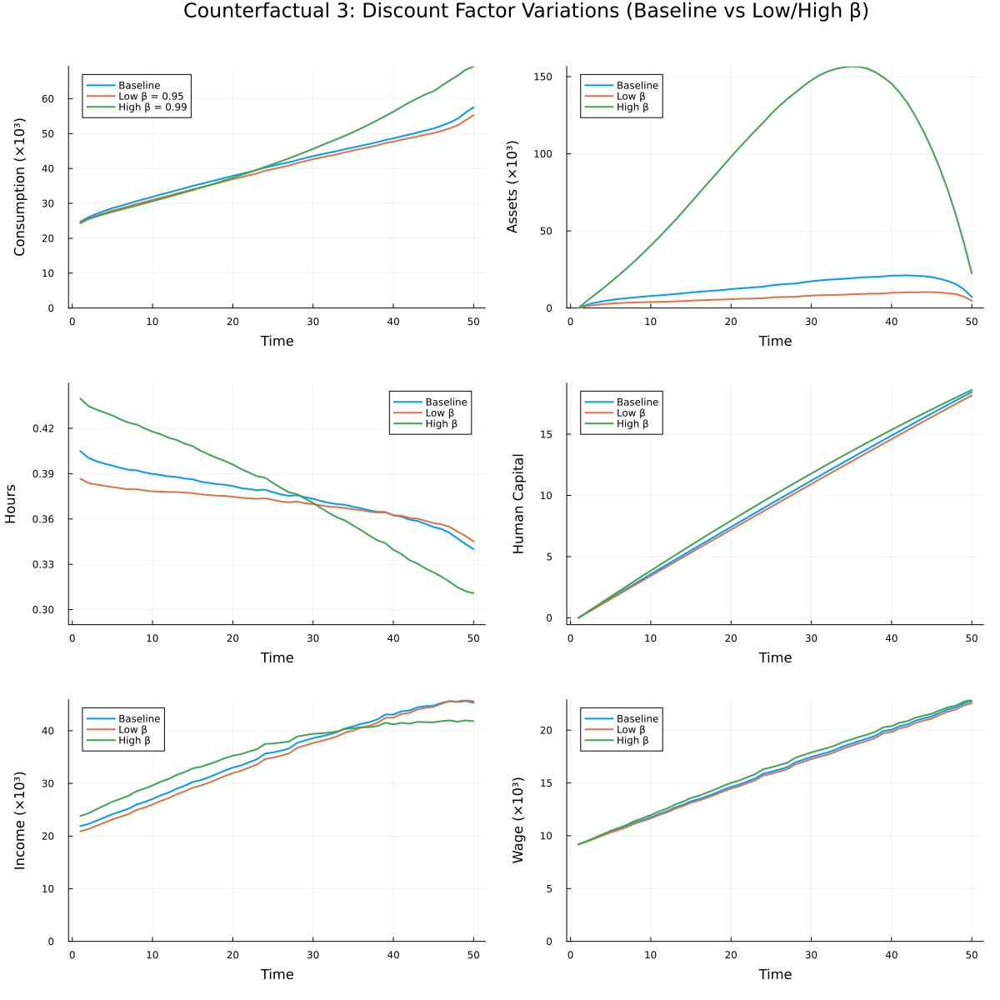

In [27]:
# ----------------------------------------------
# 3. Discount Factor Variations (Low and High β)
# ----------------------------------------------

# Extract simulated series
low_beta  = extract_all(model_low_beta)
high_beta = extract_all(model_high_beta)

# Time vector
t = 1:length(base.c)

# Max values for y-limits
ymax_c = maximum(vcat(base.c, low_beta.c, high_beta.c))
ymax_a = maximum(vcat(base.a, low_beta.a, high_beta.a, ymax_c))  # keep ymax_c as instructed
ymax_income = maximum(vcat(base.income, low_beta.income, high_beta.income))
ymax_wage = maximum(vcat(base.wage, low_beta.wage, high_beta.wage))

# Formatter for monetary values
thousand_formatter = (val -> @sprintf("%.0f", val / 1_000))

# Plot 1: Consumption
p1 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption (×10³)", ylims=(0, ymax_c))
plot!(p1, t, low_beta.c, label="Low β = 0.95", lw=2)
plot!(p1, t, high_beta.c, label="High β = 0.99", lw=2)

# Plot 2: Assets
p2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets (×10³)", ylims=(0, ymax_a))
plot!(p2, t, low_beta.a, label="Low β", lw=2)
plot!(p2, t, high_beta.a, label="High β", lw=2)

# Plot 3: Hours
p3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours", ylims=(0.29, 0.45))
plot!(p3, t, low_beta.h, label="Low β", lw=2)
plot!(p3, t, high_beta.h, label="High β", lw=2)

# Plot 4: Human Capital
p4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(p4, t, low_beta.k, label="Low β", lw=2)
plot!(p4, t, high_beta.k, label="High β", lw=2)

# Plot 5: Income
p5 = plot(t, base.income, label="Baseline", lw=2, xlabel="Time", ylabel="Income (×10³)", ylims=(0, ymax_income))
plot!(p5, t, low_beta.income, label="Low β", lw=2)
plot!(p5, t, high_beta.income, label="High β", lw=2)

# Plot 6: Wage
p6 = plot(t, base.wage, label="Baseline", lw=2, xlabel="Time", ylabel="Wage (×10³)", ylims=(0, ymax_wage))
plot!(p6, t, low_beta.wage, label="Low β", lw=2)
plot!(p6, t, high_beta.wage, label="High β", lw=2)


# Combine all plots in a 3x2 layout
combined_plot_3 = plot(p1, p2, p3, p4, p5, p6,
                       layout=(3, 2),
                       size=(1200, 1200),
                       plot_title="Counterfactual 3: Discount Factor Variations (Baseline vs Low/High β)",
                       titlefont=16,
                       margin=3mm)

##### Counterfactual 4: **Frisch Elasticity & Labor Disutility**

We vary the elasticity of labor supply (η) and the disutility weight of working (φ).

- **Baseline:** η = 5.0
- **High Frisch Elasticity:** η = 3.0 
- **Low Frisch Elasticity:** η = 7.0

> 💡 **Interpretation:**  
> A lower η implies a more elastic labor supply—agents respond more to wage changes.

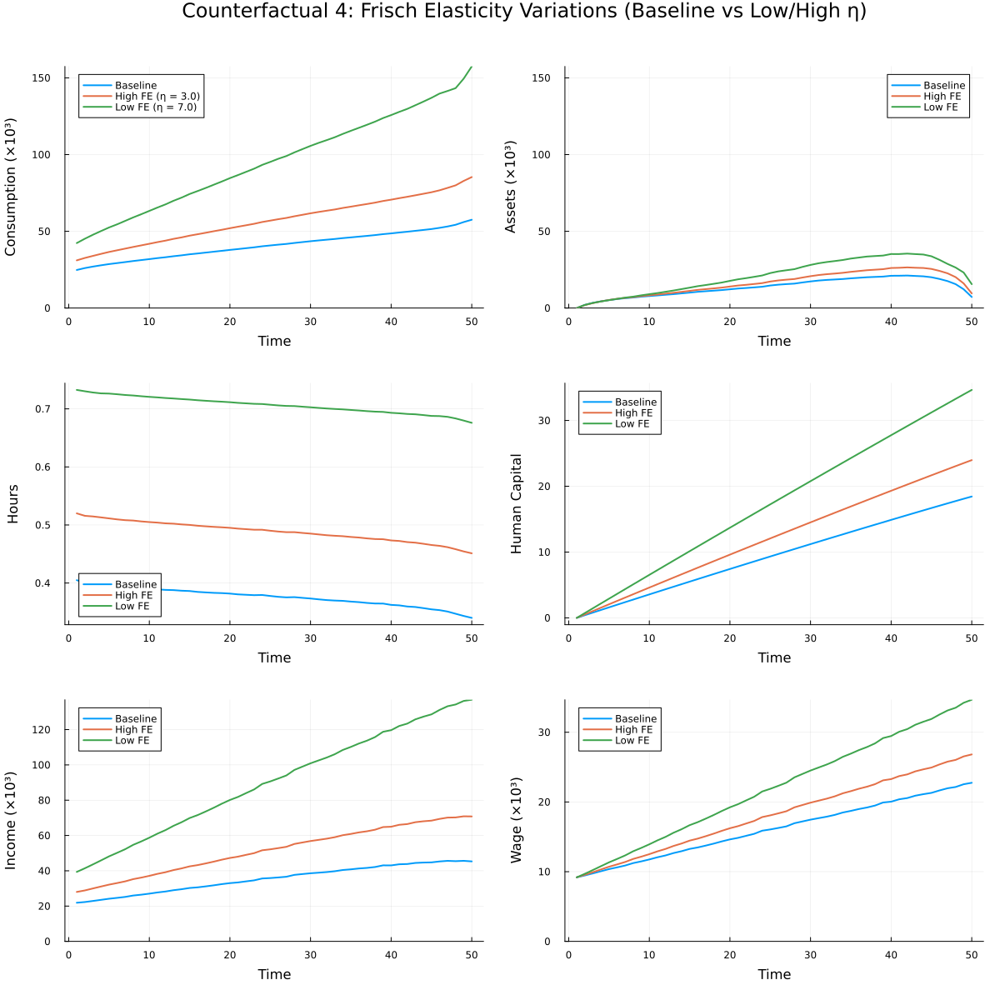

In [28]:
# ----------------------------------------------
# 4. Frisch Elasticity (η)
# ----------------------------------------------

# Extract data
high_fe = extract_all(model_high_fe)
low_fe = extract_all(model_low_fe)

# Time vector
t = 1:length(base.c)

# Max values for y-limits
ymax_c = maximum(vcat(base.c, high_fe.c, low_fe.c))
ymax_a = maximum(vcat(base.a, high_fe.a, low_fe.a, ymax_c))  # keep ymax_c in asset range
ymax_income = maximum(vcat(base.income, high_fe.income, low_fe.income))
ymax_wage = maximum(vcat(base.wage, high_fe.wage, low_fe.wage))

# Formatter
thousand_formatter = (val -> @sprintf("%.0f", val / 1_000))

# Plot 1: Consumption
p1 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption (×10³)", ylims=(0, ymax_c))
plot!(p1, t, high_fe.c, label="High FE (η = 3.0)", lw=2)
plot!(p1, t, low_fe.c, label="Low FE (η = 7.0)", lw=2)

# Plot 2: Assets
p2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets (×10³)", ylims=(0, ymax_a))
plot!(p2, t, high_fe.a, label="High FE", lw=2)
plot!(p2, t, low_fe.a, label="Low FE", lw=2)

# Plot 3: Hours
p3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(p3, t, high_fe.h, label="High FE", lw=2)
plot!(p3, t, low_fe.h, label="Low FE", lw=2)

# Plot 4: Human Capital
p4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(p4, t, high_fe.k, label="High FE", lw=2)
plot!(p4, t, low_fe.k, label="Low FE", lw=2)

# Plot 5: Income
p5 = plot(t, base.income, label="Baseline", lw=2, xlabel="Time", ylabel="Income (×10³)", ylims=(0, ymax_income))
plot!(p5, t, high_fe.income, label="High FE", lw=2)
plot!(p5, t, low_fe.income, label="Low FE", lw=2)

# Plot 6: Wage
p6 = plot(t, base.wage, label="Baseline", lw=2, xlabel="Time", ylabel="Wage (×10³)", ylims=(0, ymax_wage))
plot!(p6, t, high_fe.wage, label="High FE", lw=2)
plot!(p6, t, low_fe.wage, label="Low FE", lw=2)


# Combine into 3x2 layout
combined_plot_4 = plot(p1, p2, p3, p4, p5, p6,
                       layout=(3, 2),
                       size=(1200, 1200),
                       plot_title="Counterfactual 4: Frisch Elasticity Variations (Baseline vs Low/High η)",
                       titlefont=16,
                       margin=3mm)

##### Counterfactual 5: **Initial Asset Distribution**

We introduce heterogeneity in initial wealth by drawing from a lognormal distribution.

- **Baseline:** Initial assets = 0  
- **Counterfactual:** Initial assets ∼ LogNormal(μ = 9.4, σ = 0.45; ~90% to fall between 5,000 and 20,000)

> 💡 **Interpretation:**  
> Agents starting with more wealth consume more and work slightly less early in life. Their asset accumulation path is flatter compared to the baseline.

---


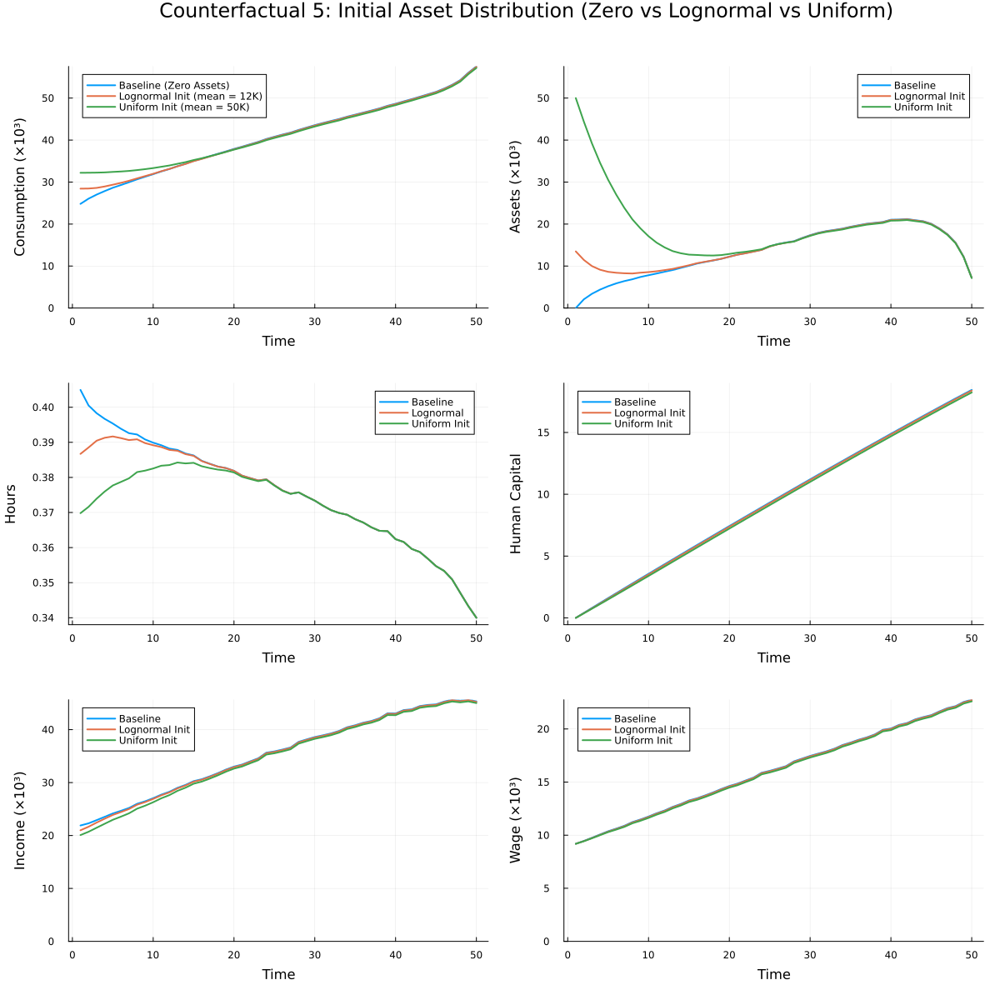

In [29]:
# ----------------------------------------------
# 5. Initial Asset Distribution (Zero vs Lognormal vs Uniform)
# ----------------------------------------------

# Extract data
lognorm = extract_all(model_lognormal)
uniform = extract_all(model_uniform)

# Time vector
t = 1:length(base.c)

# Max values for y-limits
ymax_c = maximum(vcat(base.c, lognorm.c, uniform.c))
ymax_a = maximum(vcat(base.a, lognorm.a, uniform.a, ymax_c))  # including ymax_c as before
ymax_income = maximum(vcat(base.income, lognorm.income, uniform.income))
ymax_wage = maximum(vcat(base.wage, lognorm.wage, uniform.wage))

# Formatter
thousand_formatter = (val -> @sprintf("%.0f", val))

# Plot 1: Consumption
p1 = plot(t, base.c, label="Baseline (Zero Assets)", lw=2, xlabel="Time", ylabel="Consumption (×10³)", ylims=(0, ymax_c))
plot!(p1, t, lognorm.c, label="Lognormal Init (mean = 12K)", lw=2)
plot!(p1, t, uniform.c, label="Uniform Init (mean = 50K)", lw=2)

# Plot 2: Assets
p2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets (×10³)", ylims=(0, ymax_a))
plot!(p2, t, lognorm.a, label="Lognormal Init", lw=2)
plot!(p2, t, uniform.a, label="Uniform Init", lw=2)
plot!(p2, yformatter=thousand_formatter)

# Plot 3: Hours
p3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(p3, t, lognorm.h, label="Lognormal", lw=2)
plot!(p3, t, uniform.h, label="Uniform Init", lw=2)

# Plot 4: Human Capital
p4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(p4, t, lognorm.k, label="Lognormal Init", lw=2)
plot!(p4, t, uniform.k, label="Uniform Init", lw=2)

# Plot 5: Income
p5 = plot(t, base.income, label="Baseline", lw=2, xlabel="Time", ylabel="Income (×10³)", ylims=(0, ymax_income))
plot!(p5, t, lognorm.income, label="Lognormal Init", lw=2)
plot!(p5, t, uniform.income, label="Uniform Init", lw=2)
plot!(p5, yformatter=thousand_formatter)

# Plot 6: Wage
p6 = plot(t, base.wage, label="Baseline", lw=2, xlabel="Time", ylabel="Wage (×10³)", ylims=(0, ymax_wage))
plot!(p6, t, lognorm.wage, label="Lognormal Init", lw=2)
plot!(p6, t, uniform.wage, label="Uniform Init", lw=2)

# Combine into 3x2 layout
combined_plot_5 = plot(p1, p2, p3, p4, p5, p6,
                       layout=(3, 2),
                       size=(1200, 1200),
                       plot_title="Counterfactual 5: Initial Asset Distribution (Zero vs Lognormal vs Uniform)",
                       titlefont=16,
                       margin=3mm)

##### Counterfactual 6: **Retirement Income Reduction**

We simulate a drop in labor income during the later stages of the life cycle to approximate retirement. Specifically, we assume that after period 40, wages fall to 70% of their original level.

- **Baseline:** Constant wage $ w $ throughout life  
- **Retirement Scenario:** $ w_t = 0.7w $ for $ t \geq 40 $

> 💡 **Interpretation:**  
> As wages decline post-retirement, individuals **reduce consumption**, **draw down savings**, and **work fewer hours** if feasible.  
> The model captures lifecycle behavior such as **asset decumulation** and **increased reliance on prior savings** to smooth consumption in retirement.

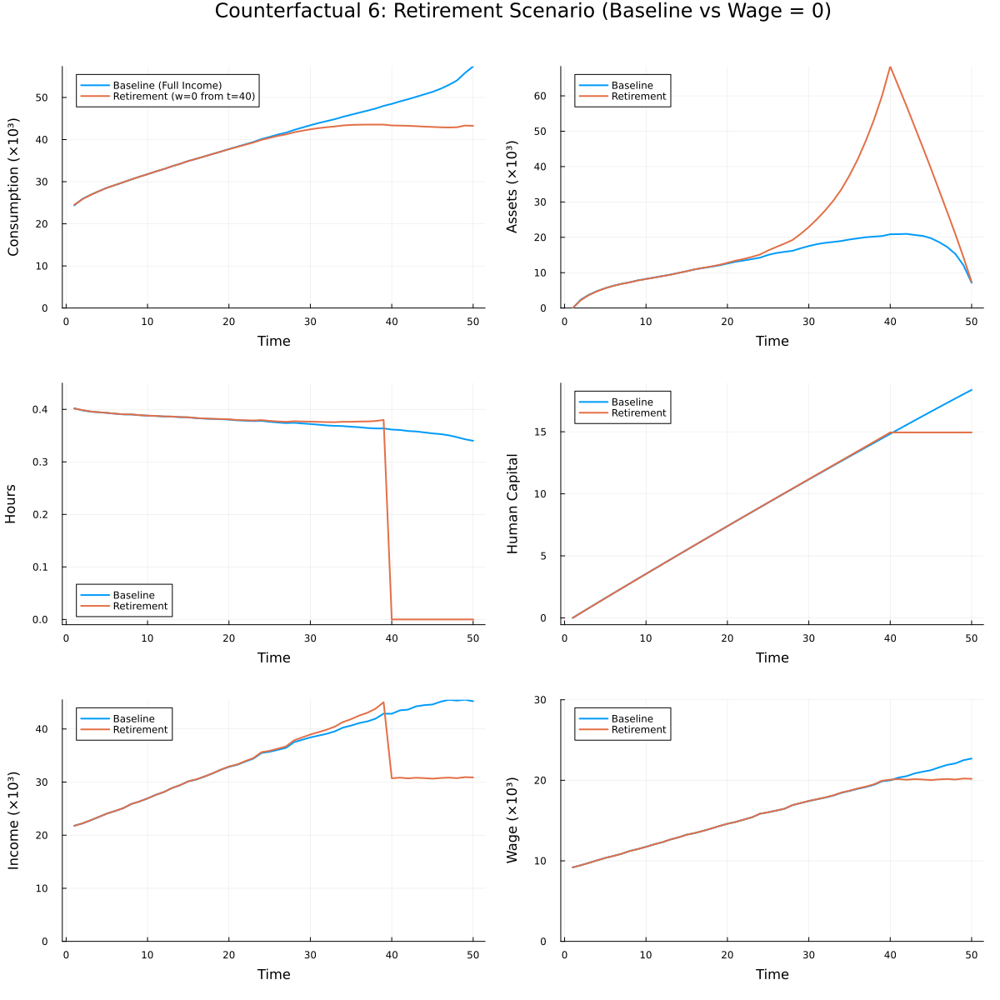

In [ ]:
# ----------------------------------------------
# 6. Retirement Scenario (Baseline vs Wage = 0)
# ----------------------------------------------

# Extract simulation data
base   = extract_all(model_baseline)     # Full income every period
retire = extract_all(model_baseline_retire)   # Wage drops to 0 from t = 40

# Time vector
t = 1:length(base.c)

# Max values for y-limits
ymax_c = maximum(vcat(base.c, retire.c))
ymax_a = maximum(vcat(base.a, retire.a, ymax_c))  # keep ymax_c for asset scaling
ymax_income = maximum(vcat(base.income, retire.income))
ymax_wage = maximum(vcat(base.wage, retire.wage))

# Formatter for monetary variables
thousand_formatter = (val -> @sprintf("%.0f", val))

# Plot 1: Consumption
p1 = plot(t, base.c, label="Baseline (Full Income)", lw=2, xlabel="Time", ylabel="Consumption (×10³)", ylims=(0, ymax_c))
plot!(p1, t, retire.c, label="Retirement (w=0 from t=40)", lw=2)
plot!(p1, yformatter=thousand_formatter)

# Plot 2: Assets
p2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets (×10³)", ylims=(0, ymax_a))
plot!(p2, t, retire.a, label="Retirement", lw=2)
plot!(p2, yformatter=thousand_formatter)

# Plot 3: Hours
p3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours", ylims=(-0.01, 0.45))
plot!(p3, t, retire.h, label="Retirement", lw=2)

# Plot 4: Human Capital
p4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(p4, t, retire.k, label="Retirement", lw=2)

# Plot 5: Income
p5 = plot(t, base.income, label="Baseline", lw=2, xlabel="Time", ylabel="Income (×10³)", ylims=(0, ymax_income))
plot!(p5, t, retire.income, label="Retirement", lw=2)
plot!(p5, yformatter=thousand_formatter)

# Plot 6: Wage
p6 = plot(t, base.wage, label="Baseline", lw=2, xlabel="Time", ylabel="Wage (×10³)", ylims=(0, 30))
plot!(p6, t, retire.wage, label="Retirement", lw=2)


# Combine into 3x2 layout
combined_plot_6 = plot(p1, p2, p3, p4, p5, p6,
                       layout=(3, 2),
                       size=(1200, 1200),
                       plot_title="Counterfactual 6: Retirement Scenario (Baseline vs Wage = 0)",
                       titlefont=16,
                       margin=3mm)

##### Counterfactual 7: **Interest Rate Variations**

We alter the interest rate $ r $ to understand how the return on savings influences household decisions.

- **Baseline:** $ r = 3\% $  
- **Low r:** $ r = 1\% $  
- **High r:** $ r = 5\% $

> 💡 **Interpretation:**  
> A **higher interest rate** increases the return on saving, encouraging **greater asset accumulation** and potentially **lower labor supply** due to income effects.  
> A **lower interest rate** reduces the incentive to save, leading to **lower wealth** and possibly **higher labor supply** to maintain consumption levels.

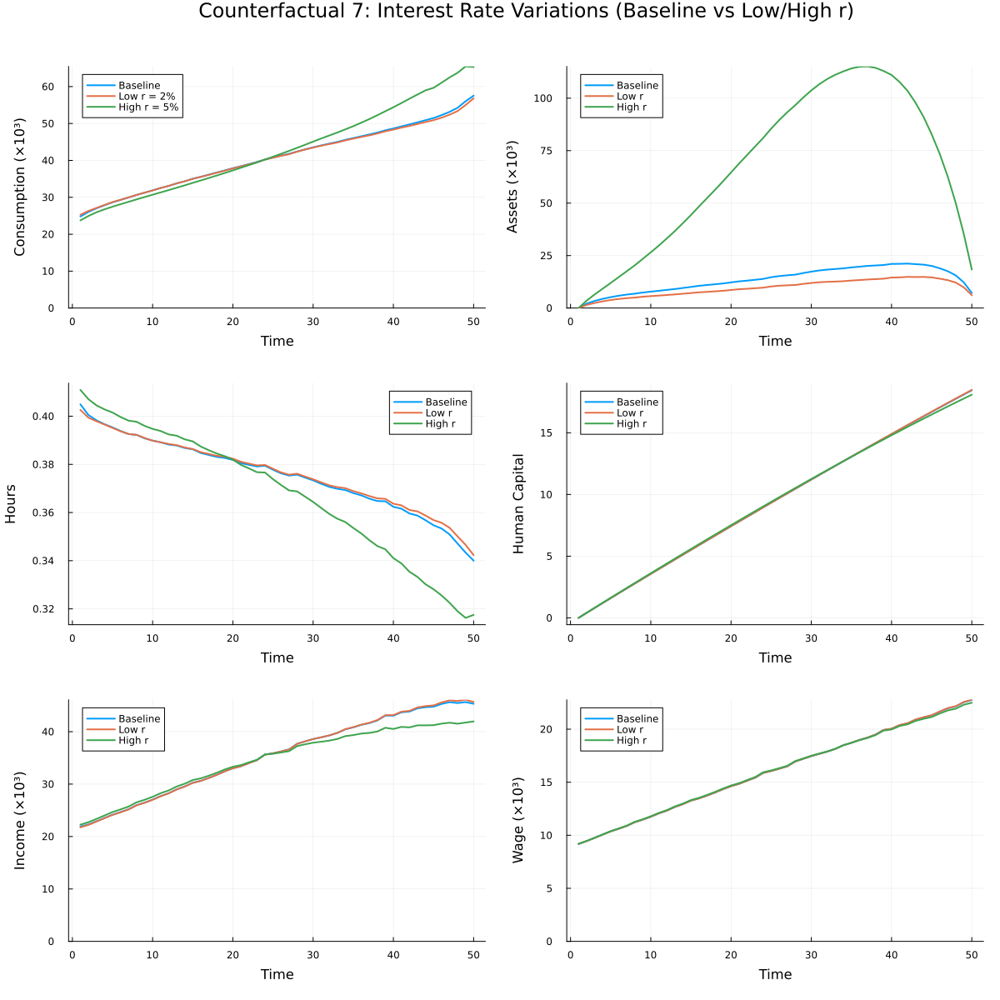

In [30]:
# ----------------------------------------------
# 7. Interest Rate Variations (Baseline vs Low/High r)
# ----------------------------------------------

# Extract simulated series
low_r  = extract_all(model_low_r)
high_r = extract_all(model_high_r)

# Time vector
t = 1:length(base.c)

# Max values for y-limits
ymax_c = maximum(vcat(base.c, low_r.c, high_r.c))
ymax_a = maximum(vcat(base.a, low_r.a, high_r.a, ymax_c))  # include ymax_c
ymax_income = maximum(vcat(base.income, low_r.income, high_r.income))
ymax_wage = maximum(vcat(base.wage, low_r.wage, high_r.wage))

# Formatter
thousand_formatter = (val -> @sprintf("%.0f", val))

# Plot 1: Consumption
p1 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption (×10³)", ylims=(0, ymax_c))
plot!(p1, t, low_r.c, label="Low r = 2%", lw=2)
plot!(p1, t, high_r.c, label="High r = 5%", lw=2)
plot!(p1, yformatter=thousand_formatter)

# Plot 2: Assets
p2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets (×10³)", ylims=(0, ymax_a))
plot!(p2, t, low_r.a, label="Low r", lw=2)
plot!(p2, t, high_r.a, label="High r", lw=2)
plot!(p2, yformatter=thousand_formatter)

# Plot 3: Hours
p3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(p3, t, low_r.h, label="Low r", lw=2)
plot!(p3, t, high_r.h, label="High r", lw=2)

# Plot 4: Human Capital
p4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(p4, t, low_r.k, label="Low r", lw=2)
plot!(p4, t, high_r.k, label="High r", lw=2)

# Plot 5: Income
p5 = plot(t, base.income, label="Baseline", lw=2, xlabel="Time", ylabel="Income (×10³)", ylims=(0, ymax_income))
plot!(p5, t, low_r.income, label="Low r", lw=2)
plot!(p5, t, high_r.income, label="High r", lw=2)
plot!(p5, yformatter=thousand_formatter)

# Plot 6: Wage
p6 = plot(t, base.wage, label="Baseline", lw=2, xlabel="Time", ylabel="Wage (×10³)", ylims=(0, ymax_wage))
plot!(p6, t, low_r.wage, label="Low r", lw=2)
plot!(p6, t, high_r.wage, label="High r", lw=2)


# Combine into 3x2 layout
combined_plot_7 = plot(p1, p2, p3, p4, p5, p6,
                       layout=(3, 2),
                       size=(1200, 1200),
                       plot_title="Counterfactual 7: Interest Rate Variations (Baseline vs Low/High r)",
                       titlefont=16,
                       margin=3mm)

In [73]:
# -------------------------------
# Utility: Nonlinear Grid Creator
# -------------------------------
function nonlinspace(start::Float64, stop::Float64, num::Int, curv::Float64)
    lin_vals = range(0, stop=1, length=num)
    curved_vals = lin_vals .^ curv
    return start .+ (stop - start) .* curved_vals
end


function create_focused_grid(a_min::Float64, a_focus::Float64, a_max::Float64, Na::Int, focus_share::Float64, curv::Float64)
    # Number of points in the focus region (0 to 250,000)
    Na_focus = ceil(Int, Na * focus_share)
    # Number of points in the remaining region (250,000 to 1,000,000)
    Na_rest = Na - Na_focus
    
    # Create grid for the focus region
    grid_focus = nonlinspace(a_min, a_focus, Na_focus, curv)
    # Create grid for the upper region, excluding the duplicate point at a_focus
    grid_rest = nonlinspace(a_focus, a_max, Na_rest + 1, curv)[2:end]
    
    # Combine the two grids
    return vcat(grid_focus, grid_rest)
end


# -------------------------------
# Dynamic Labor Model Definition
# -------------------------------
mutable struct ConSavLabor_stochastic_retirement
    T::Int                        # Time periods
    rho::Float64                 # Risk aversion (CRRA)
    beta::Float64                # Discount factor
    phi::Float64                 # Weight on labor disutility
    eta::Float64                 # Frisch elasticity parameter
    alpha::Float64               # Productivity or returns to labor
    w::Float64                   # Base wage rate
    y::Float64                   # Non-labor income
    tau::Float64                 # Labor income tax
    r::Float64                   # Interest rate
    a_max::Float64               # Max asset level
    a_min::Float64               # Min asset level
    Na::Int                      # Number of asset grid points
    k_max::Float64               # Max labor effort
    Nk::Int                      # Number of labor grid points
    simT::Int                    # Simulation time periods
    simN::Int                    # Number of simulated agents
    a_grid::Vector{Float64}      # Asset grid
    k_grid::Vector{Float64}      # Labor grid

    Nt::Int                      # Number of grid points for t
    t_grid::Vector{Float64}      # Grid for transitory shock t
    sigma_eps::Float64           # Std dev of transitory shock
    t_weight::Vector{Float64}    # Weights for t quadrature

    sol_c::Array{Float64,4}      # Optimal consumption [T, Na, Nk, Nt]
    sol_h::Array{Float64,4}      # Optimal labor effort [T, Na, Nk, Nt]
    sol_v::Array{Float64,4}      # Value function [T, Na, Nk, Nt]
    
    sim_c::Array{Float64,2}      # Simulated consumption [simN, simT]
    sim_h::Array{Float64,2}      # Simulated labor [simN, simT]
    sim_a::Array{Float64,2}      # Simulated assets [simN, simT]
    sim_k::Array{Float64,2}      # Simulated labor choice [simN, simT]
    sim_t::Array{Float64,2}      # Simulated transitory shock [simN, simT]
    sim_a_init::Vector{Float64}  # Initial assets
    sim_k_init::Vector{Float64}  # Initial labor effort
    sim_w_eff::Array{Float64,2}  # Effective wage for simulation [simN, simT]
    sim_income::Array{Float64,2}  # Simulated income [simN, simT]

    
    draws_uniform::Array{Float64,2}  # Uniform draws for simulation [simN, simT]
    w_vec::Vector{Float64}       # Time-varying wage vector [T]
    t_retire::Int                # Retirement time
    h_avg::Float64               # Average labor effort (initialized to 0)
end

# -------------------------------
# Constructor for ConSavLabor
# -------------------------------
function ConSavLabor_stochastic_retirement(; T::Int=50, beta::Float64=0.97, rho::Float64=1.0,
                     y::Float64=5000.0,r::Float64=0.03, a_max::Float64=150000.0,
                     Na::Int=30, simN::Int=5000, a_min::Float64=0.0, k_max::Float64=50.0,
                     Nk::Int=30, w::Float64=12.5, tau::Float64=0.25,
                     eta::Float64=2.0, alpha::Float64=0.08,
                     phi::Float64=20.0, seed::Int=1234,
                     sigma_eps::Float64=0.3, Nt::Int=3, t_retire::Int=40, h_avg::Float64=0.35)


       simT = T
       a_grid = create_focused_grid(a_min, 40000.0, a_max, Na, 0.8, 1.1)
       k_grid = nonlinspace(0.0, k_max, Nk, 1.5)

    simT = T
    a_grid = create_focused_grid(a_min, 40000.0, a_max, Na, 0.8, 1.1)
    k_grid = nonlinspace(0.0, k_max, Nk, 1.5)

    # Gauss-Hermite quadrature for shocks
    # Gauss-Hermite quadrature for epsilon ~ N(0,1)
    nodes, weights = gausshermite(Nt)
    # Define shock grid for log-normal distribution
    mu = -0.5 * sigma_eps^2  # Ensures E[t_shock] = 1
    t_grid = exp.(mu .+ sigma_eps .* nodes)  # t_shock = exp(epsilon), epsilon ~ N(mu, sigma_eps^2)
    t_weight = weights / sum(weights)  # Normalize weights to sum to 1

    # Solution storage
    sol_shape = (T, Na, Nk, Nt)  
    sol_c = fill(NaN, sol_shape)   # Now 4D to include shocks
    sol_h = fill(NaN, sol_shape)
    sol_v = fill(NaN, sol_shape)  # Value function is expected value, so still 3D

    # Simulation storage
    sim_shape = (simN, simT)
    sim_c = fill(NaN, sim_shape)
    sim_h = fill(NaN, sim_shape)
    sim_a = fill(NaN, sim_shape)
    sim_k = fill(NaN, sim_shape)
    sim_t = fill(NaN, sim_shape)
    sim_w_eff = fill(NaN, sim_shape)  # Effective wage for simulation
    sim_income = fill(NaN, sim_shape)  # Simulated income

    # Random draws
    rng = MersenneTwister(seed)
    draws_uniform = rand(rng, sim_shape...)

    # Initial conditions
    sim_a_init = zeros(Float64, simN)
    sim_k_init = zeros(Float64, simN)


    # Wage vector
    w_vec = fill(w, T)

    return ConSavLabor_stochastic_retirement(T, rho, beta, phi, eta, alpha, w, y, tau, r,
                       a_max, a_min, Na, k_max, Nk, simT, simN,
                       a_grid, k_grid,
                       Nt, t_grid, sigma_eps, t_weight,
                       sol_c, sol_h, sol_v,
                       sim_c, sim_h, sim_a, sim_k, sim_t,
                       sim_a_init, sim_k_init, sim_w_eff, sim_income,
                       draws_uniform, w_vec, t_retire, h_avg)
end

function solve_model!(model::ConSavLabor_stochastic_retirement)
    T, Na, Nk, Nt = model.T, model.Na, model.Nk, model.Nt
    a_grid, k_grid, t_grid = model.a_grid, model.k_grid, model.t_grid
    sol_c, sol_h, sol_v = model.sol_c, model.sol_h, model.sol_v
    t_retire, h_avg = model.t_retire, model.h_avg

    # **Final Period (t = T), during retirement**
    for i_a in 1:Na
        for i_k in 1:Nk
            for i_t in 1:Nt
                assets = a_grid[i_a]
                capital = k_grid[i_k]
                t_shock = t_grid[i_t]
                wage = wage_func(model, capital, T, t_shock)
                pension = 0.7 * wage * h_avg  # Pension during retirement
                cons = assets + pension + model.y       # Consume all resources
                sol_h[T, i_a, i_k, i_t] = 0.0
                sol_c[T, i_a, i_k, i_t] = cons
                sol_v[T, i_a, i_k, i_t] = util(model, cons, 0.0)
            end
        end
    end

    # **Retirement Periods (t = T-1 to t_retire)**
    @showprogress 1 "Solving retirement periods..." for t in (T-1):-1:t_retire
        interp = create_interp(model, sol_v, t + 1)
        for i_a in 1:Na
            for i_k in 1:Nk
                for i_t in 1:Nt
                    assets = a_grid[i_a]
                    capital = k_grid[i_k]
                    t_shock = t_grid[i_t]
                    wage = wage_func(model, capital, t, t_shock)
                    pension = 0.7 * wage * h_avg
                    function obj_retire(c::Float64)
                        a_next = (1.0 + model.r) * assets + pension - c + model.y
                        k_next = capital  # h = 0, so capital doesn't grow
                        V_next = sum(model.t_weight[j] * interp[j](a_next, k_next) for j in 1:Nt)
                        penalty_c = c < 0.0 ? (abs(c)^2) * 1.0e7 : 0.0
                        penalty_a = a_next < model.a_min ? ((model.a_min - a_next)^2) * 1.0e12 : 0.0
                        return -(util(model, c, 0.0) + model.beta * V_next - penalty_c - penalty_a)
                    end
                    opt = Opt(:LN_COBYLA, 1)
                    lower_bounds!(opt, [1e-6])
                    upper_bounds!(opt, [assets + pension + 1e6])
                    ftol_rel!(opt, 1e-8)
                    min_objective!(opt, (c_vec, grad) -> obj_retire(c_vec[1]))
                    init = [sol_c[t + 1, i_a, i_k, i_t]]
                    (minf, c_opt, ret) = optimize(opt, init)
                    sol_c[t, i_a, i_k, i_t] = c_opt[1]
                    sol_h[t, i_a, i_k, i_t] = 0.0
                    sol_v[t, i_a, i_k, i_t] = -minf
                end
            end
        end
    end

    # **Working Periods (t = t_retire - 1 to 1)**
    @showprogress 1 "Solving working periods..." for t in (t_retire - 1):-1:1
        interp = create_interp(model, sol_v, t + 1)
        for i_a in 1:Na
            for i_k in 1:Nk
                for i_t in 1:Nt
                    assets = a_grid[i_a]
                    capital = k_grid[i_k]
                    t_shock = t_grid[i_t]
                    function obj_work(x::Vector, grad::Vector)
                        c, h = x[1], x[2]
                        return -value_of_work_choice(model, c, h, assets, capital, t, t_shock, interp)
                    end
                    opt = Opt(:LN_COBYLA, 2)
                    lower_bounds!(opt, [0.0, 0.0])
                    upper_bounds!(opt, [Inf, 1.0])
                    ftol_rel!(opt, 1e-8)
                    min_objective!(opt, obj_work)
                    init = [sol_c[t + 1, i_a, i_k, i_t], sol_h[t + 1, i_a, i_k, i_t]]
                    (minf, x_opt, ret) = optimize(opt, init)
                    sol_c[t, i_a, i_k, i_t] = x_opt[1]
                    sol_h[t, i_a, i_k, i_t] = x_opt[2]
                    sol_v[t, i_a, i_k, i_t] = -minf
                end
            end
        end
    end
    return model
end

# Supporting Functions (unchanged)
@inline function util(model::ConSavLabor_stochastic_retirement, c, h)
    if model.rho == 1.0
        cons_utility = log(c)
    else
        cons_utility = (c^(1.0 - model.rho)) / (1.0 - model.rho)
    end
    labor_disutility = model.phi * (h^(1.0 + model.eta)) / (1.0 + model.eta)
    return cons_utility - labor_disutility
end



@inline function wage_func(model::ConSavLabor_stochastic_retirement, capital::Float64, t::Int, t_shock::Float64)
    return (1.0 - model.tau) * model.w_vec[t] * t_shock * (1.0 + model.alpha * capital) * 5840
end

function create_interp(model::ConSavLabor_stochastic_retirement, sol_v::Array{Float64,4}, t::Int)
    return [LinearInterpolation((model.a_grid, model.k_grid), sol_v[t, :, :, i_t], extrapolation_bc=Line()) for i_t in 1:model.Nt]
end

function value_of_work_choice(model::ConSavLabor_stochastic_retirement, c::Float64, h::Float64, assets::Float64,
    capital::Float64, t::Int, t_shock::Float64, interp::Vector)
    penalty_c = c < 0.0 ? (abs(c)^2) * 1.0e7 : 0.0
    penalty_h = h < 0.0 ? (abs(h)^2) * 10e7 : 0.0
    w_eff = wage_func(model, capital, t, t_shock)
    a_next = (1.0 + model.r) * assets + w_eff * h - c + model.y
    penalty_a = a_next < model.a_min ? ((model.a_min - a_next)^2) * 1.0e12 : 0.0
    k_next = capital + h
    V_next = sum(model.t_weight[j] * interp[j](a_next, k_next) for j in 1:model.Nt)
    util_now = util(model, c, h)
    return util_now + model.beta * V_next - penalty_c - penalty_h - penalty_a
end


function simulate_model!(model::ConSavLabor_stochastic_retirement)
    simN, simT = model.simN, model.simT
    sim_a, sim_k, sim_t, sim_w_eff = model.sim_a, model.sim_k, model.sim_t, model.sim_w_eff
    sim_c, sim_h, sim_income = model.sim_c, model.sim_h, model.sim_income
    draws_uniform = model.draws_uniform
    t_retire, h_avg = model.t_retire, model.h_avg  # Assuming simT = model.T

    # Precompute interpolation objects
    interp_dict = Dict()
    for t in 1:simT, i_t in 1:model.Nt
        interp_dict[(t, i_t, :c)] = LinearInterpolation((model.a_grid, model.k_grid), model.sol_c[t, :, :, i_t], extrapolation_bc=Line())
        interp_dict[(t, i_t, :h)] = LinearInterpolation((model.a_grid, model.k_grid), model.sol_h[t, :, :, i_t], extrapolation_bc=Line())
    end

    # Initialize simulation
    for i in 1:simN
        sim_a[i, 1] = model.sim_a_init[i]
        sim_k[i, 1] = model.sim_k_init[i]
        sim_t[i, 1] = 0.0
    end

    # Simulation loop
    for i in 1:simN
        for t in 1:simT
            cum_weights = cumsum(model.t_weight)
            u = draws_uniform[i, t]
            i_t = findfirst(u .<= cum_weights)
            sim_t[i, t] = model.t_grid[i_t]

            interp_c = interp_dict[(t, i_t, :c)]
            interp_h = interp_dict[(t, i_t, :h)]
            sim_c[i, t] = interp_c(sim_a[i, t], sim_k[i, t])
            if t >= t_retire
                sim_h[i, t] = 0.0
                sim_w_eff[i, t] = wage_func(model, sim_k[i, t], t, sim_t[i, t]) /5840
                sim_income[i, t] = 0.7 * wage_func(model, sim_k[i, t], t, sim_t[i, t]) * h_avg
            else
                sim_h[i, t] = clamp(interp_h(sim_a[i, t], sim_k[i, t]), 0.0, 1.0)
                sim_w_eff[i, t] = wage_func(model, sim_k[i, t], t, sim_t[i, t]) / 5840
                sim_income[i, t] = wage_func(model, sim_k[i, t], t, sim_t[i, t]) * sim_h[i, t]
            end
            if t < simT
                sim_a[i, t+1] = (1 + model.r) * sim_a[i, t] + sim_income[i, t] - sim_c[i, t] + model.y
                sim_k[i, t+1] = sim_k[i, t] + sim_h[i, t]
            end
        end
    end
end



simulate_model! (generic function with 2 methods)

In [ ]:
# ============================
# Baseline and Counterfactuals
# ============================

# -- Baseline Model (Default Parameters) --
model_baseline_retire = ConSavLabor_stochastic_retirement(alpha=0.08, h_avg=x)
#model_baseline_retire.sim_a_init .= rand(rng, model_baseline_retire.simN) .* 100000;
solve_model!(model_baseline_retire)
simulate_model!(model_baseline_retire)

Solving working model... 100%|███████████████████████████| Time: 0:00:02
Solving working periods... 100%|█████████████████████████| Time: 0:00:01
